In [1]:
# AeroCNN-II with U-Net
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import datetime
%matplotlib inline

In [2]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 128
strides1 = 1
strides2 = 2
lr = 5e-04
val_rate=0.2
test_rate=0.1
input_size = 100
batch_size = 20

In [3]:
main_directory = 'D:\\20221103aeroCNNII(-1to1)'
os.chdir(main_directory)

In [4]:
case_directory = 'offset0.5_validation'+str(val_rate)+'test'+str(test_rate)
if not os.path.exists(case_directory):
    os.makedirs(case_directory)
    
case_storage = main_directory+"\\"+case_directory

In [5]:
alpha = np.linspace(-10,20,16).reshape((-1,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133*16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\20221103aeroCNNII(-1to1)\offset0.5"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_coord = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [11]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + "_.csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133*16, 100, 100,1))

In [14]:
image = 1-image/100

In [15]:
path = 'D:\\airfoilFlowField'
file_list = os.listdir(path)
file_list_py = [file for file in file_list if file.endswith('.csv')]

In [16]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 0].values

In [17]:
data_name = path + '\\' + str(geometry_orig[0]) + "alpha"+ str(int(alpha[1])) + "_interpolated.csv"
print(data_name)

D:\airfoilFlowField\airfoil1alpha-8_interpolated.csv


In [18]:
path = 'D:\\rotatedInterpolation_pow2\\n_grid128(-1to1)offset0.5\\velocityMagnitudeField'

In [19]:
Vmag_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        data_name = path + '\\' + str(geometry_orig[i-1]) + "alpha"+ str(int(alpha[j])) + "_velocityMagnitudeInterpolated.csv"
        data = pd.read_csv(data_name, header=None)
        Vmag_df = pd.concat([Vmag_df, data], axis=0)

In [20]:
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
y_imp = Vmag_df.iloc[:, :].values

In [22]:
y = y_imp.reshape((133*16, n_grid, n_grid, 1))

In [23]:
targetMax = np.max(y)
targetMin = np.min(y)

In [68]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [25]:
geometry.shape

(2128, 1)

In [26]:
geometry = geometry.reshape((133*16, 1))

In [69]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(
    image, aa, geometry, y, test_size=test_rate, random_state=1)

In [70]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(
    x_all, aa_all, geo_all, y_all, test_size=val_rate/(1-test_rate), random_state=1)

In [29]:
y_train_nor = (y_train-targetMin)/(targetMax-targetMin)

In [30]:
y_val_nor = (y_val-targetMin)/(targetMax-targetMin)

In [31]:
y_test_nor = (y_test-targetMin)/(targetMax-targetMin)

In [32]:
tf.keras.backend.set_image_data_format('channels_last')

In [33]:
input_image = tf.keras.Input(shape=(100, 100, 1))

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer1')(input_image)
x_maxpool1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer2')(x_maxpool1)
x_maxpool2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_maxpool2)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_deconv1)

output_impr = tf.keras.layers.Conv2D(1, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                     activation='relu', padding='same',
                                     kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                     name='Conv2Doutput')(x_deconv2)
x_flat = tf.keras.layers.Flatten()(output_impr)
x_fc = tf.keras.layers.Dense(units=n_grid**2, activation='linear', name='outputLayer',
                             kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_flat)
output_data = tf.keras.layers.Reshape((n_grid, n_grid,1))(x_fc)
# CNN autoencoder
model = tf.keras.Model(input_image, output_data)

In [34]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 conv2d_transpose (Conv2DTra  (None, 50, 50, 200)      360200

In [35]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [36]:
os.chdir(case_storage)

es = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100, min_delta=6e-7,
                                      restore_best_weights=True, verbose=1)
rp = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', patience=70, factor=0.5,
                                          min_delta = 1e-07, min_lr=1e-06,
                                          verbose=1)

In [37]:
start = datetime.datetime.now()
history = model.fit(x_train, y_train_nor, validation_data=[x_val, y_val_nor], batch_size=batch_size,
                    epochs=5000, shuffle=True, callbacks=[es, rp])
end = datetime.datetime.now()

Epoch 1/5000
75/75 [==============================] - 10s 57ms/step - loss: 0.0179 - rmse: 0.1339 - val_loss: 0.0032 - val_rmse: 0.0563 - lr: 5.0000e-04
Epoch 2/5000
75/75 [==============================] - 3s 44ms/step - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0031 - val_rmse: 0.0552 - lr: 5.0000e-04
Epoch 3/5000
75/75 [==============================] - 3s 45ms/step - loss: 0.0026 - rmse: 0.0512 - val_loss: 0.0017 - val_rmse: 0.0412 - lr: 5.0000e-04
Epoch 4/5000
75/75 [==============================] - 3s 45ms/step - loss: 0.0014 - rmse: 0.0367 - val_loss: 0.0011 - val_rmse: 0.0333 - lr: 5.0000e-04
Epoch 5/5000
75/75 [==============================] - 3s 44ms/step - loss: 0.0011 - rmse: 0.0322 - val_loss: 9.3558e-04 - val_rmse: 0.0304 - lr: 5.0000e-04
Epoch 6/5000
75/75 [==============================] - 3s 44ms/step - loss: 9.3822e-04 - rmse: 0.0304 - val_loss: 8.6597e-04 - val_rmse: 0.0292 - lr: 5.0000e-04
Epoch 7/5000
75/75 [==============================] - 3s 45ms/step - loss: 

75/75 [==============================] - 3s 41ms/step - loss: 3.8172e-04 - rmse: 0.0192 - val_loss: 4.7195e-04 - val_rmse: 0.0214 - lr: 5.0000e-04
Epoch 53/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.6625e-04 - rmse: 0.0188 - val_loss: 4.9476e-04 - val_rmse: 0.0219 - lr: 5.0000e-04
Epoch 54/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.6981e-04 - rmse: 0.0189 - val_loss: 4.8837e-04 - val_rmse: 0.0218 - lr: 5.0000e-04
Epoch 55/5000
75/75 [==============================] - 3s 45ms/step - loss: 3.5222e-04 - rmse: 0.0184 - val_loss: 4.8019e-04 - val_rmse: 0.0216 - lr: 5.0000e-04
Epoch 56/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.6505e-04 - rmse: 0.0188 - val_loss: 5.2604e-04 - val_rmse: 0.0226 - lr: 5.0000e-04
Epoch 57/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.5773e-04 - rmse: 0.0186 - val_loss: 4.8728e-04 - val_rmse: 0.0218 - lr: 5.0000e-04
Epoch 58/5000
75/75 [===========================

Epoch 103/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5184e-04 - rmse: 0.0154 - val_loss: 4.6898e-04 - val_rmse: 0.0213 - lr: 5.0000e-04
Epoch 104/5000
75/75 [==============================] - 3s 45ms/step - loss: 2.4640e-04 - rmse: 0.0153 - val_loss: 4.8888e-04 - val_rmse: 0.0218 - lr: 5.0000e-04
Epoch 105/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4743e-04 - rmse: 0.0153 - val_loss: 4.7632e-04 - val_rmse: 0.0215 - lr: 5.0000e-04
Epoch 106/5000
75/75 [==============================] - 3s 45ms/step - loss: 2.3971e-04 - rmse: 0.0150 - val_loss: 4.7852e-04 - val_rmse: 0.0216 - lr: 5.0000e-04
Epoch 107/5000
75/75 [==============================] - 3s 45ms/step - loss: 2.3887e-04 - rmse: 0.0150 - val_loss: 4.9161e-04 - val_rmse: 0.0219 - lr: 5.0000e-04
Epoch 108/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4516e-04 - rmse: 0.0152 - val_loss: 4.7859e-04 - val_rmse: 0.0216 - lr: 5.0000e-04
Epoch 109/5000
75/75 [======

75/75 [==============================] - 3s 45ms/step - loss: 1.7539e-04 - rmse: 0.0127 - val_loss: 5.0240e-04 - val_rmse: 0.0221 - lr: 5.0000e-04
Epoch 154/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7848e-04 - rmse: 0.0128 - val_loss: 5.0565e-04 - val_rmse: 0.0222 - lr: 5.0000e-04
Epoch 155/5000
75/75 [==============================] - 3s 45ms/step - loss: 1.7320e-04 - rmse: 0.0126 - val_loss: 5.0043e-04 - val_rmse: 0.0221 - lr: 5.0000e-04
Epoch 156/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7448e-04 - rmse: 0.0127 - val_loss: 4.8347e-04 - val_rmse: 0.0217 - lr: 5.0000e-04
Epoch 157/5000
75/75 [==============================] - 3s 45ms/step - loss: 1.6996e-04 - rmse: 0.0125 - val_loss: 4.8978e-04 - val_rmse: 0.0218 - lr: 5.0000e-04
Epoch 158/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7127e-04 - rmse: 0.0126 - val_loss: 5.0859e-04 - val_rmse: 0.0223 - lr: 5.0000e-04
Epoch 159/5000
75/75 [=====================

Epoch 204/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3192e-04 - rmse: 0.0109 - val_loss: 5.2311e-04 - val_rmse: 0.0226 - lr: 5.0000e-04
Epoch 205/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3044e-04 - rmse: 0.0108 - val_loss: 5.2232e-04 - val_rmse: 0.0226 - lr: 5.0000e-04
Epoch 206/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3366e-04 - rmse: 0.0110 - val_loss: 5.2475e-04 - val_rmse: 0.0226 - lr: 5.0000e-04
Epoch 207/5000
75/75 [==============================] - 3s 45ms/step - loss: 1.2610e-04 - rmse: 0.0106 - val_loss: 5.1078e-04 - val_rmse: 0.0223 - lr: 5.0000e-04
Epoch 208/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2842e-04 - rmse: 0.0107 - val_loss: 5.1590e-04 - val_rmse: 0.0224 - lr: 5.0000e-04
Epoch 209/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2759e-04 - rmse: 0.0107 - val_loss: 5.0803e-04 - val_rmse: 0.0222 - lr: 5.0000e-04
Epoch 210/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 9.9480e-05 - rmse: 0.0093 - val_loss: 5.1803e-04 - val_rmse: 0.0225 - lr: 5.0000e-04
Epoch 255/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0204e-04 - rmse: 0.0094 - val_loss: 5.3641e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 256/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0257e-04 - rmse: 0.0095 - val_loss: 5.3024e-04 - val_rmse: 0.0227 - lr: 5.0000e-04
Epoch 257/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0296e-04 - rmse: 0.0095 - val_loss: 5.2694e-04 - val_rmse: 0.0227 - lr: 5.0000e-04
Epoch 258/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0387e-04 - rmse: 0.0095 - val_loss: 5.2492e-04 - val_rmse: 0.0226 - lr: 5.0000e-04
Epoch 259/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0344e-04 - rmse: 0.0095 - val_loss: 5.3087e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 260/5000
75/75 [=====================

Epoch 305/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5625e-05 - rmse: 0.0085 - val_loss: 5.3555e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 306/5000
75/75 [==============================] - 3s 41ms/step - loss: 9.2191e-05 - rmse: 0.0089 - val_loss: 5.3479e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 307/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5210e-05 - rmse: 0.0085 - val_loss: 5.3313e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 308/5000
75/75 [==============================] - 3s 45ms/step - loss: 7.9670e-05 - rmse: 0.0082 - val_loss: 5.3284e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 309/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.9624e-05 - rmse: 0.0082 - val_loss: 5.3124e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 310/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.6331e-05 - rmse: 0.0086 - val_loss: 5.4157e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 311/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 7.1155e-05 - rmse: 0.0076 - val_loss: 5.5019e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 356/5000
75/75 [==============================] - 3s 41ms/step - loss: 6.7854e-05 - rmse: 0.0074 - val_loss: 5.4669e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 357/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.9866e-05 - rmse: 0.0082 - val_loss: 5.4415e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 358/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.1017e-05 - rmse: 0.0076 - val_loss: 5.3863e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 359/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.2991e-05 - rmse: 0.0078 - val_loss: 5.3913e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 360/5000
75/75 [==============================] - 3s 45ms/step - loss: 6.6737e-05 - rmse: 0.0073 - val_loss: 5.3174e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 361/5000
75/75 [=====================

Epoch 406/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.6468e-05 - rmse: 0.0066 - val_loss: 5.5736e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 407/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.8291e-05 - rmse: 0.0068 - val_loss: 5.3993e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 408/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.8781e-05 - rmse: 0.0068 - val_loss: 5.6686e-04 - val_rmse: 0.0235 - lr: 5.0000e-04
Epoch 409/5000
75/75 [==============================] - 3s 41ms/step - loss: 6.5455e-05 - rmse: 0.0073 - val_loss: 5.4968e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 410/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.8193e-05 - rmse: 0.0068 - val_loss: 5.4061e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 411/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.8219e-05 - rmse: 0.0068 - val_loss: 5.4771e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 412/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 6.4265e-05 - rmse: 0.0072 - val_loss: 5.5344e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 457/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.7152e-05 - rmse: 0.0067 - val_loss: 5.5470e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 458/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.6186e-05 - rmse: 0.0066 - val_loss: 5.5158e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 459/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.2423e-05 - rmse: 0.0063 - val_loss: 5.5221e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 460/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.9153e-05 - rmse: 0.0061 - val_loss: 5.5012e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 461/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.9637e-05 - rmse: 0.0061 - val_loss: 5.4362e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 462/5000
75/75 [=====================

Epoch 507/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.4722e-05 - rmse: 0.0057 - val_loss: 5.5372e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 508/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.4863e-05 - rmse: 0.0058 - val_loss: 5.4765e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 509/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.4689e-05 - rmse: 0.0057 - val_loss: 5.4784e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 510/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.3916e-05 - rmse: 0.0057 - val_loss: 5.4902e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 511/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.3442e-05 - rmse: 0.0056 - val_loss: 5.4806e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 512/5000
75/75 [==============================] - 3s 45ms/step - loss: 4.2262e-05 - rmse: 0.0055 - val_loss: 5.5408e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 513/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 3.9153e-05 - rmse: 0.0053 - val_loss: 5.3869e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 558/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.8708e-05 - rmse: 0.0052 - val_loss: 5.4868e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 559/5000
75/75 [==============================] - 3s 45ms/step - loss: 3.7719e-05 - rmse: 0.0051 - val_loss: 5.4760e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 560/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.7841e-05 - rmse: 0.0051 - val_loss: 5.4696e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 561/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.7705e-05 - rmse: 0.0051 - val_loss: 5.4781e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 562/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.7355e-05 - rmse: 0.0051 - val_loss: 5.5530e-04 - val_rmse: 0.0233 - lr: 5.0000e-04
Epoch 563/5000
75/75 [=====================

Epoch 608/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2840e-05 - rmse: 0.0047 - val_loss: 5.4493e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 609/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3575e-05 - rmse: 0.0047 - val_loss: 5.4862e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 610/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3262e-05 - rmse: 0.0047 - val_loss: 5.4368e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 611/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2831e-05 - rmse: 0.0047 - val_loss: 5.4379e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 612/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3247e-05 - rmse: 0.0047 - val_loss: 5.4349e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 613/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3275e-05 - rmse: 0.0047 - val_loss: 5.3867e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 614/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 3.3314e-05 - rmse: 0.0048 - val_loss: 5.4396e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 659/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3213e-05 - rmse: 0.0047 - val_loss: 5.3213e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 660/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3015e-05 - rmse: 0.0047 - val_loss: 5.4614e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 661/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2427e-05 - rmse: 0.0047 - val_loss: 5.4331e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 662/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3953e-05 - rmse: 0.0048 - val_loss: 5.4009e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 663/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2720e-05 - rmse: 0.0047 - val_loss: 5.4358e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 664/5000
75/75 [=====================

Epoch 709/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.7671e-05 - rmse: 0.0042 - val_loss: 5.4146e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 710/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.8410e-05 - rmse: 0.0042 - val_loss: 5.4037e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 711/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.9352e-05 - rmse: 0.0044 - val_loss: 5.3305e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 712/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0639e-05 - rmse: 0.0045 - val_loss: 5.4035e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 713/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.9580e-05 - rmse: 0.0044 - val_loss: 5.3833e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 714/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.9627e-05 - rmse: 0.0044 - val_loss: 5.3831e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 715/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 2.5380e-05 - rmse: 0.0039 - val_loss: 5.3587e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 760/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5340e-05 - rmse: 0.0039 - val_loss: 5.3286e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 761/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5283e-05 - rmse: 0.0039 - val_loss: 5.3601e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 762/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5370e-05 - rmse: 0.0039 - val_loss: 5.3181e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 763/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4988e-05 - rmse: 0.0039 - val_loss: 5.3574e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 764/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5628e-05 - rmse: 0.0039 - val_loss: 5.3171e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 765/5000
75/75 [=====================

Epoch 810/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.7159e-05 - rmse: 0.0042 - val_loss: 5.3351e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 811/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.6548e-05 - rmse: 0.0041 - val_loss: 5.4004e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 812/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.9288e-05 - rmse: 0.0044 - val_loss: 5.3941e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 813/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.8510e-05 - rmse: 0.0043 - val_loss: 5.3698e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 814/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.7236e-05 - rmse: 0.0042 - val_loss: 5.3757e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 815/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.7167e-05 - rmse: 0.0042 - val_loss: 5.3781e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 816/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 2.4410e-05 - rmse: 0.0039 - val_loss: 5.2900e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 861/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4124e-05 - rmse: 0.0038 - val_loss: 5.4116e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 862/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4403e-05 - rmse: 0.0039 - val_loss: 5.3511e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 863/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3970e-05 - rmse: 0.0038 - val_loss: 5.3701e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 864/5000
75/75 [==============================] - 3s 45ms/step - loss: 2.3504e-05 - rmse: 0.0038 - val_loss: 5.3631e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 865/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4368e-05 - rmse: 0.0039 - val_loss: 5.3739e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 866/5000
75/75 [=====================

Epoch 911/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4672e-05 - rmse: 0.0039 - val_loss: 5.3713e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 912/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3375e-05 - rmse: 0.0038 - val_loss: 5.3452e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 913/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.2646e-05 - rmse: 0.0037 - val_loss: 5.3241e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 914/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3300e-05 - rmse: 0.0038 - val_loss: 5.3229e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 915/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3330e-05 - rmse: 0.0038 - val_loss: 5.3434e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 916/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3297e-05 - rmse: 0.0038 - val_loss: 5.3383e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 917/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 2.1261e-05 - rmse: 0.0035 - val_loss: 5.3009e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 962/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1051e-05 - rmse: 0.0035 - val_loss: 5.3995e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 963/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1972e-05 - rmse: 0.0036 - val_loss: 5.3618e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 964/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1886e-05 - rmse: 0.0036 - val_loss: 5.3270e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 965/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1964e-05 - rmse: 0.0036 - val_loss: 5.3494e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 966/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3626e-05 - rmse: 0.0039 - val_loss: 5.3096e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 967/5000
75/75 [=====================

75/75 [==============================] - 3s 41ms/step - loss: 2.1649e-05 - rmse: 0.0036 - val_loss: 5.3211e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1012/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1015e-05 - rmse: 0.0035 - val_loss: 5.3492e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1013/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1701e-05 - rmse: 0.0036 - val_loss: 5.3226e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1014/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1910e-05 - rmse: 0.0037 - val_loss: 5.2769e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 1015/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1136e-05 - rmse: 0.0035 - val_loss: 5.3464e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1016/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.0635e-05 - rmse: 0.0035 - val_loss: 5.3144e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1017/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.8195e-05 - rmse: 0.0031 - val_loss: 5.3287e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1062/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8279e-05 - rmse: 0.0032 - val_loss: 5.3528e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 1063/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8474e-05 - rmse: 0.0032 - val_loss: 5.3400e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1064/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8203e-05 - rmse: 0.0031 - val_loss: 5.2895e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 1065/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8946e-05 - rmse: 0.0033 - val_loss: 5.3633e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 1066/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8678e-05 - rmse: 0.0032 - val_loss: 5.2655e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 1067/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 5.0782e-05 - rmse: 0.0065 - val_loss: 5.4614e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 1112/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.8183e-05 - rmse: 0.0063 - val_loss: 5.3575e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 1113/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.9907e-05 - rmse: 0.0056 - val_loss: 5.4264e-04 - val_rmse: 0.0231 - lr: 5.0000e-04
Epoch 1114/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0445e-05 - rmse: 0.0047 - val_loss: 5.4429e-04 - val_rmse: 0.0232 - lr: 5.0000e-04
Epoch 1115/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3358e-05 - rmse: 0.0039 - val_loss: 5.3235e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1116/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.1017e-05 - rmse: 0.0036 - val_loss: 5.2657e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 1117/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.8873e-05 - rmse: 0.0033 - val_loss: 5.3060e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1162/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8191e-05 - rmse: 0.0032 - val_loss: 5.3494e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 1163/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7971e-05 - rmse: 0.0032 - val_loss: 5.2960e-04 - val_rmse: 0.0228 - lr: 5.0000e-04
Epoch 1164/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8553e-05 - rmse: 0.0033 - val_loss: 5.3364e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1165/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8215e-05 - rmse: 0.0032 - val_loss: 5.3492e-04 - val_rmse: 0.0230 - lr: 5.0000e-04
Epoch 1166/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8830e-05 - rmse: 0.0033 - val_loss: 5.3036e-04 - val_rmse: 0.0229 - lr: 5.0000e-04
Epoch 1167/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.3793e-05 - rmse: 0.0025 - val_loss: 5.3065e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1211/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3779e-05 - rmse: 0.0025 - val_loss: 5.3193e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1212/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3852e-05 - rmse: 0.0025 - val_loss: 5.2963e-04 - val_rmse: 0.0228 - lr: 2.5000e-04
Epoch 1213/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3767e-05 - rmse: 0.0025 - val_loss: 5.3144e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1214/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3799e-05 - rmse: 0.0025 - val_loss: 5.3157e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1215/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3812e-05 - rmse: 0.0025 - val_loss: 5.3199e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1216/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.3540e-05 - rmse: 0.0025 - val_loss: 5.3270e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1261/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3503e-05 - rmse: 0.0025 - val_loss: 5.3437e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1262/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3465e-05 - rmse: 0.0025 - val_loss: 5.3234e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1263/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3465e-05 - rmse: 0.0025 - val_loss: 5.3284e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1264/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3436e-05 - rmse: 0.0024 - val_loss: 5.3234e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1265/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3423e-05 - rmse: 0.0024 - val_loss: 5.3480e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1266/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.3201e-05 - rmse: 0.0024 - val_loss: 5.3547e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1311/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3258e-05 - rmse: 0.0024 - val_loss: 5.3406e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1312/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3099e-05 - rmse: 0.0024 - val_loss: 5.3553e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1313/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3025e-05 - rmse: 0.0024 - val_loss: 5.3377e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1314/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3127e-05 - rmse: 0.0024 - val_loss: 5.3454e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1315/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3242e-05 - rmse: 0.0024 - val_loss: 5.3329e-04 - val_rmse: 0.0229 - lr: 2.5000e-04
Epoch 1316/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.2725e-05 - rmse: 0.0024 - val_loss: 5.3708e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1361/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2859e-05 - rmse: 0.0024 - val_loss: 5.3648e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1362/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2782e-05 - rmse: 0.0024 - val_loss: 5.3563e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1363/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2733e-05 - rmse: 0.0024 - val_loss: 5.3579e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1364/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2564e-05 - rmse: 0.0023 - val_loss: 5.3655e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1365/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2809e-05 - rmse: 0.0024 - val_loss: 5.3955e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1366/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.2265e-05 - rmse: 0.0023 - val_loss: 5.3682e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1411/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2314e-05 - rmse: 0.0023 - val_loss: 5.3742e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1412/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2401e-05 - rmse: 0.0023 - val_loss: 5.3769e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1413/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2396e-05 - rmse: 0.0023 - val_loss: 5.3912e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1414/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2346e-05 - rmse: 0.0023 - val_loss: 5.3731e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1415/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2351e-05 - rmse: 0.0023 - val_loss: 5.3708e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1416/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.1901e-05 - rmse: 0.0023 - val_loss: 5.3926e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1461/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2146e-05 - rmse: 0.0023 - val_loss: 5.3871e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1462/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1902e-05 - rmse: 0.0023 - val_loss: 5.3663e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1463/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2019e-05 - rmse: 0.0023 - val_loss: 5.3891e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1464/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2146e-05 - rmse: 0.0023 - val_loss: 5.3646e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1465/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2029e-05 - rmse: 0.0023 - val_loss: 5.3734e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1466/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.1519e-05 - rmse: 0.0022 - val_loss: 5.4089e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1511/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1659e-05 - rmse: 0.0022 - val_loss: 5.4050e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1512/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1635e-05 - rmse: 0.0022 - val_loss: 5.3950e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1513/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1614e-05 - rmse: 0.0022 - val_loss: 5.3692e-04 - val_rmse: 0.0230 - lr: 2.5000e-04
Epoch 1514/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1764e-05 - rmse: 0.0023 - val_loss: 5.4141e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1515/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1902e-05 - rmse: 0.0023 - val_loss: 5.4067e-04 - val_rmse: 0.0231 - lr: 2.5000e-04
Epoch 1516/5000
75/75 [===============

In [38]:
time = end - start
print("Training time:", time)

Training time: 1:19:43.903296


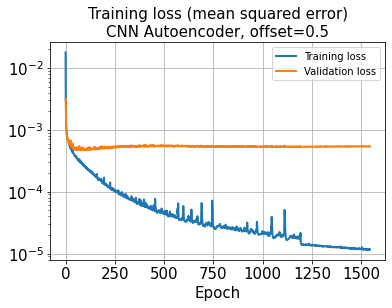

In [39]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.plot(hist['val_loss'], lw=2)
plt.title('Training loss (mean squared error)\nCNN Autoencoder, offset=0.5', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training loss', 'Validation loss'])
plt.grid()
saveName = case_storage + "\\TrainingLoss_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.5.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

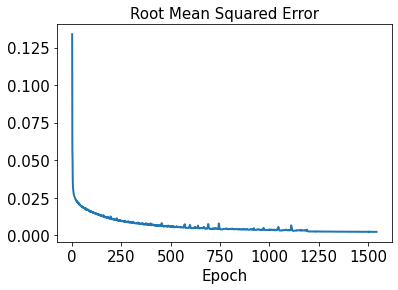

In [40]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

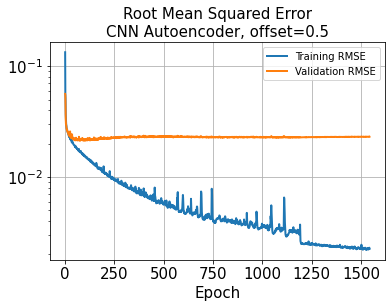

In [41]:
plt.plot(hist['rmse'], lw=2)
plt.plot(hist['val_rmse'], lw=2)
plt.title('Root Mean Squared Error\nCNN Autoencoder, offset=0.5', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training RMSE', 'Validation RMSE'])
plt.grid()
saveName = case_storage + "\\RMSE_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.5.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [42]:
test_results = model.evaluate(x_test)

7/7 [==============================] - 0s 4ms/step - loss: 6.8455e-06 - rmse: 0.0000e+00


In [43]:
decoded_train_nor = model.predict(x_train)
decoded_val_nor = model.predict(x_val)
decoded_test_nor = model.predict(x_test)

7/7 [==============================] - 0s 26ms/step


In [44]:
decoded_train = decoded_train_nor*(targetMax-targetMin) + targetMin
decoded_val = decoded_val_nor*(targetMax-targetMin) + targetMin
decoded_test = decoded_test_nor*(targetMax-targetMin) + targetMin

In [45]:
os.chdir("D:\\TrainedModels\\20221103")
model_name = "20221103AeroCNN-II_FlowField_offset0.5_val" + str(val_rate) + "test"+str(test_rate)+".h5"
model.save(model_name, overwrite=True, include_optimizer=True, save_format='h5')

In [46]:
error_train_abs = np.abs(decoded_train - y_train)

In [47]:
error_val_abs = np.abs(decoded_val - y_val)

In [48]:
error_test_abs = np.abs(decoded_test - y_test)

In [49]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.005423015969119915


In [50]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.05778678111306321


In [51]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.061680586442070195


In [52]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)

In [53]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)

In [54]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)

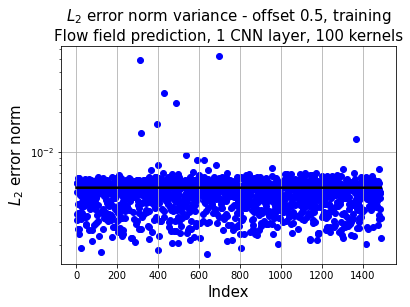

In [55]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.5, training\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\trainingErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

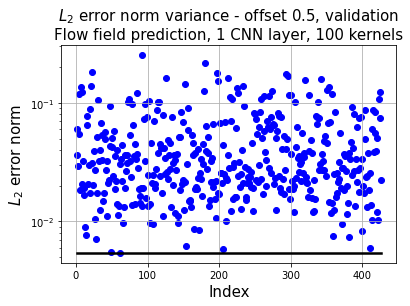

In [56]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_train*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.5, validation\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\validationErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

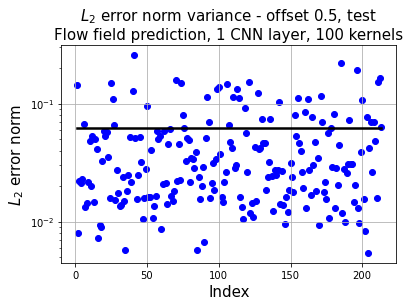

In [57]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.5, test\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\testErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [81]:
os.chdir("D:\\20221103aeroCNNII(-1to1)\\offset0.5_validation0.2test0.1")

In [82]:
xrange = np.linspace(-1, 1, n_grid)
yrange = np.linspace(-1, 1, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

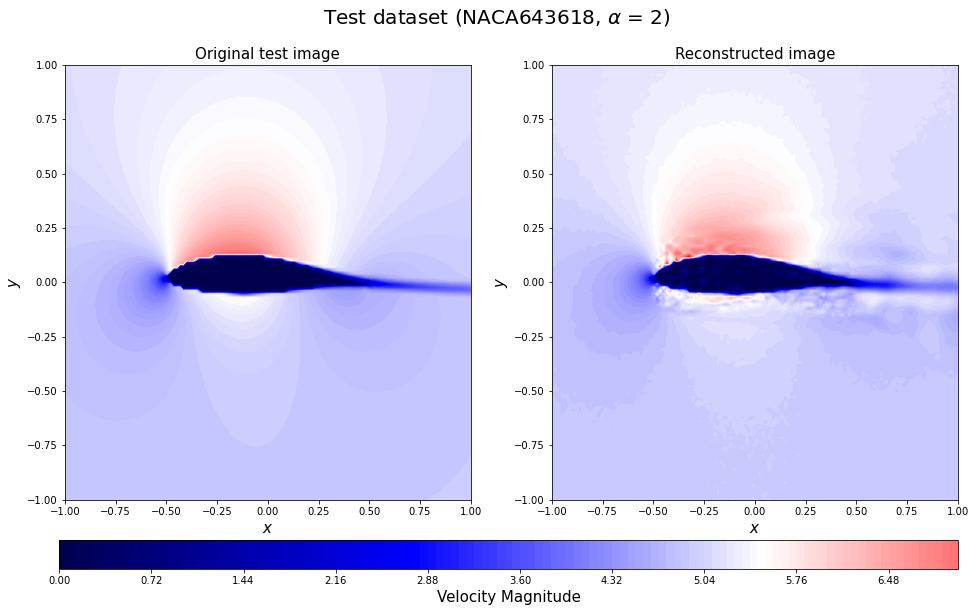

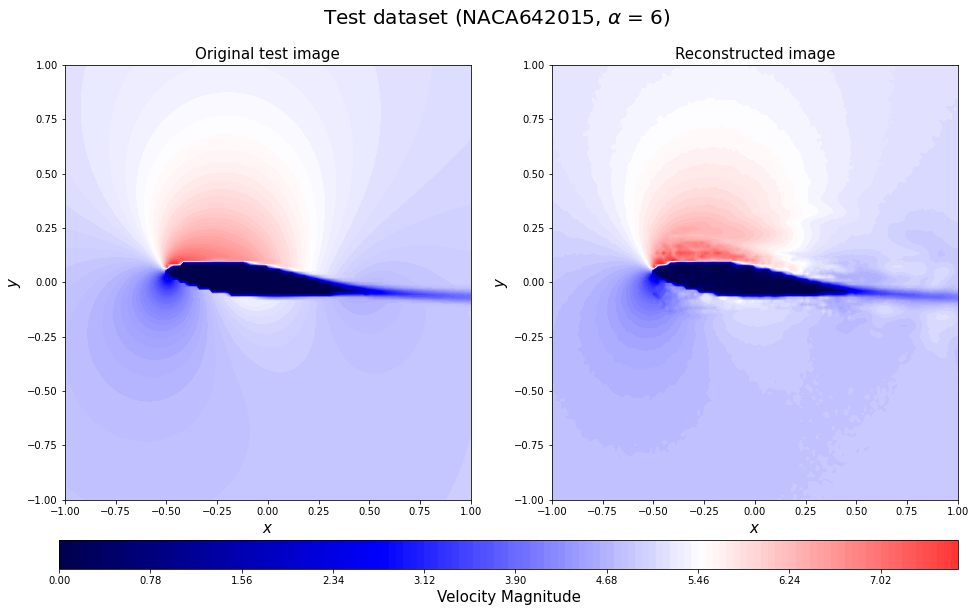

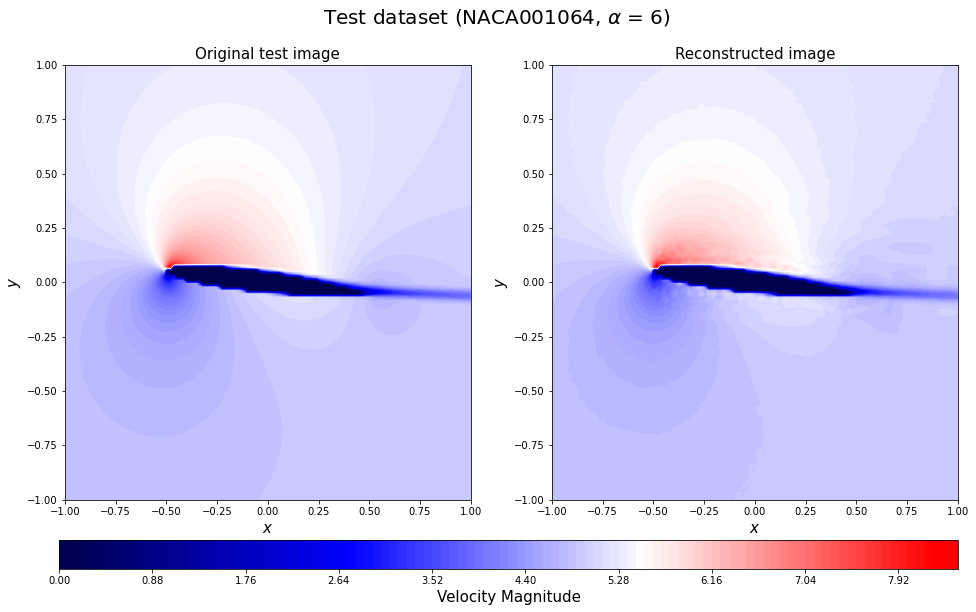

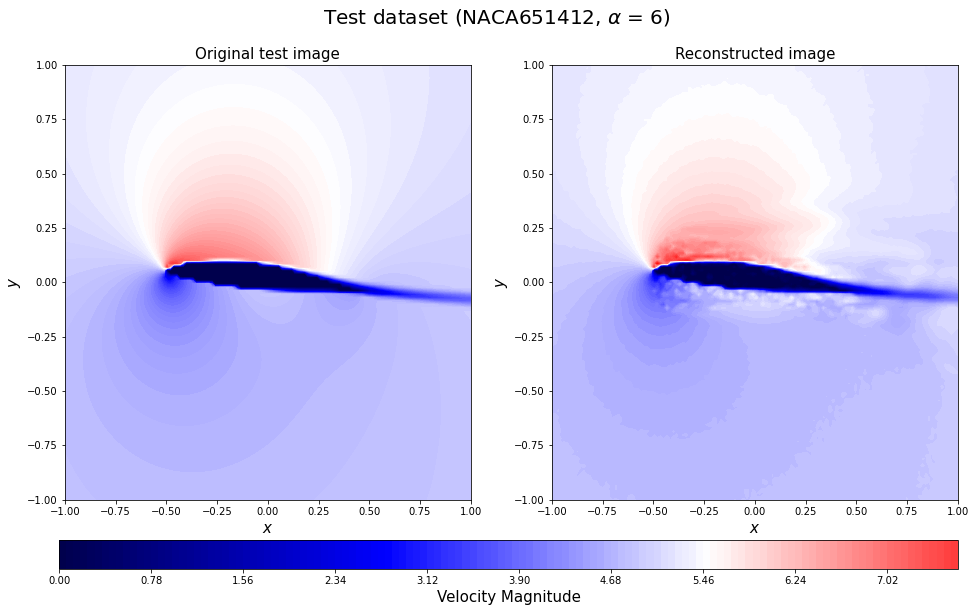

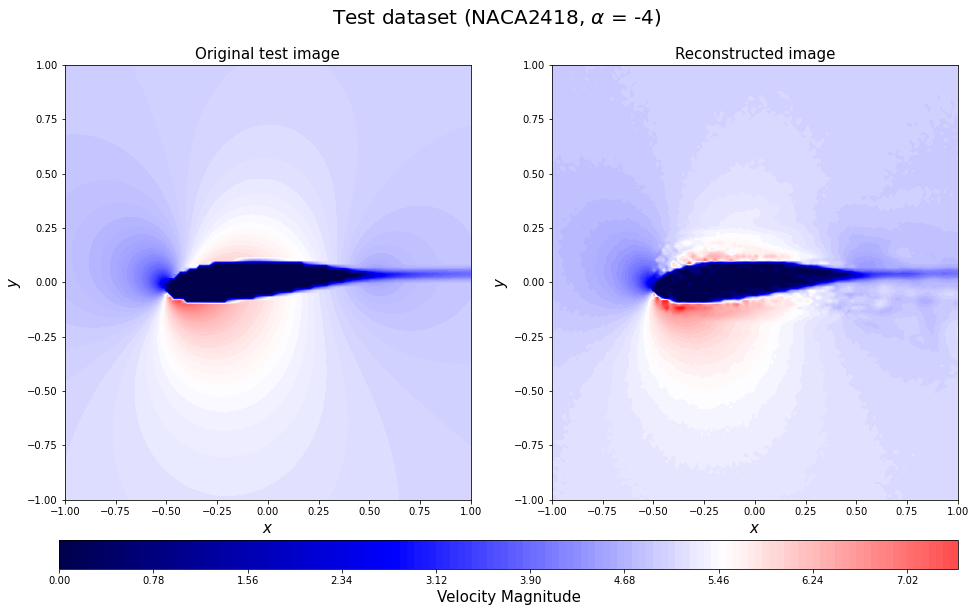

...

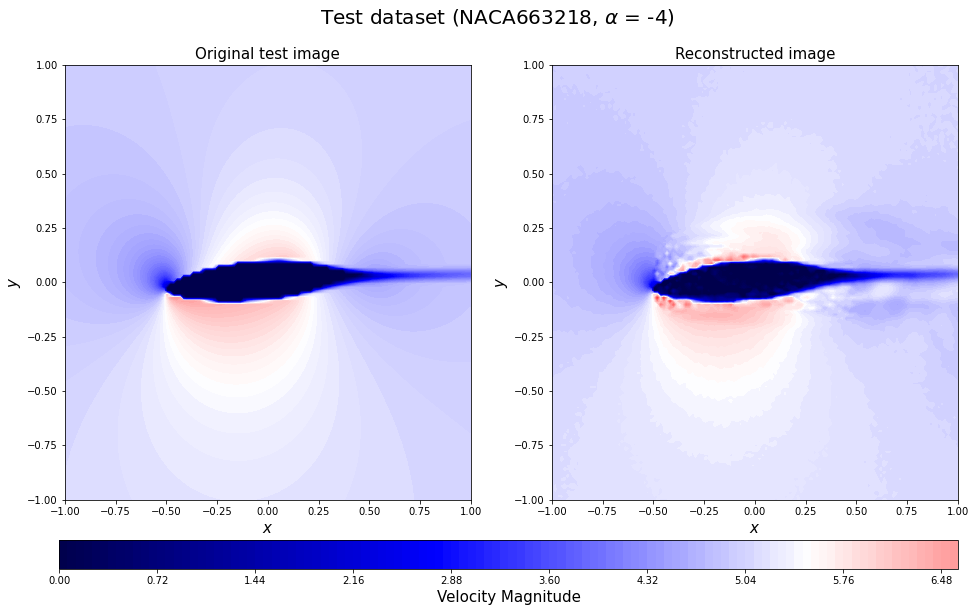

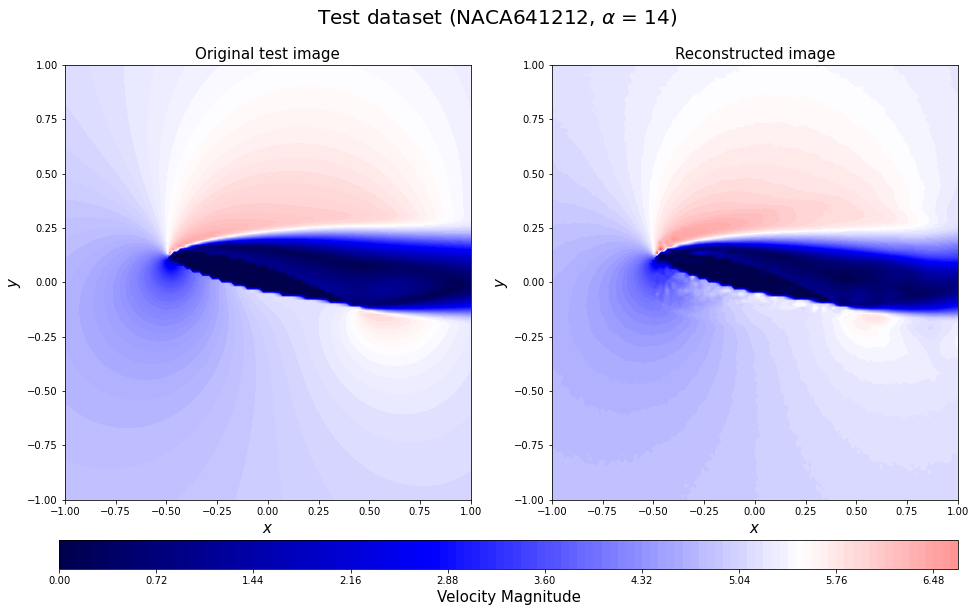

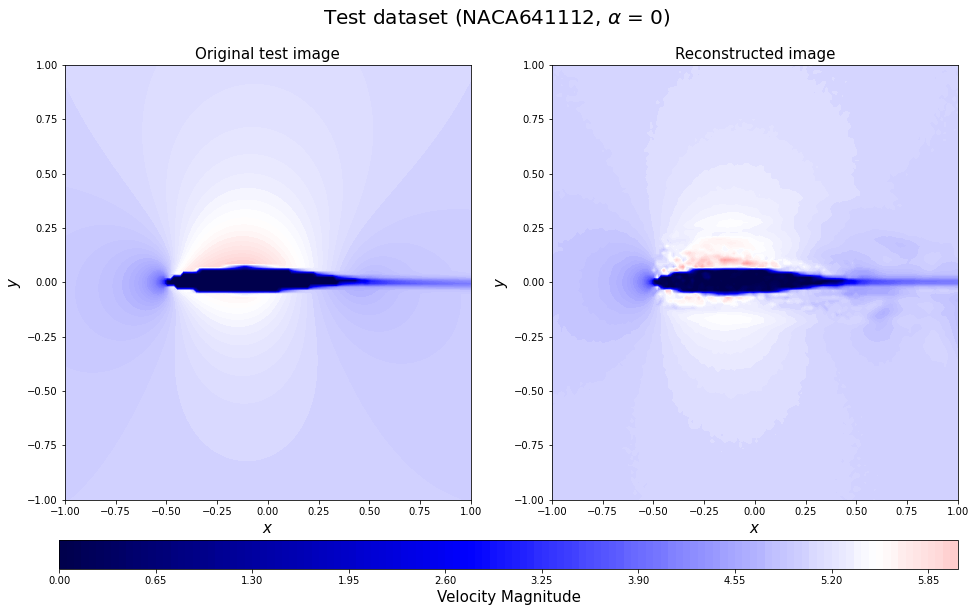

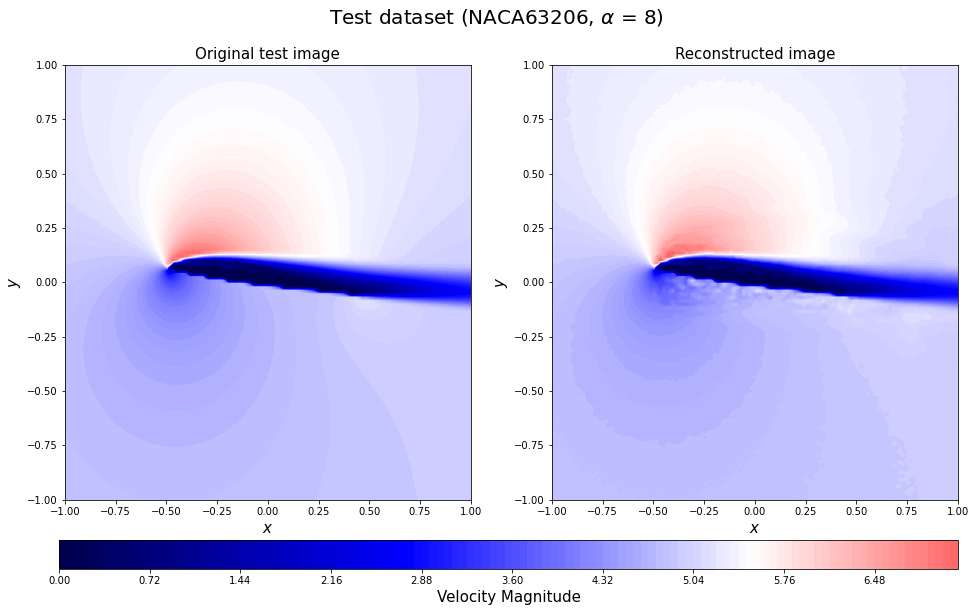

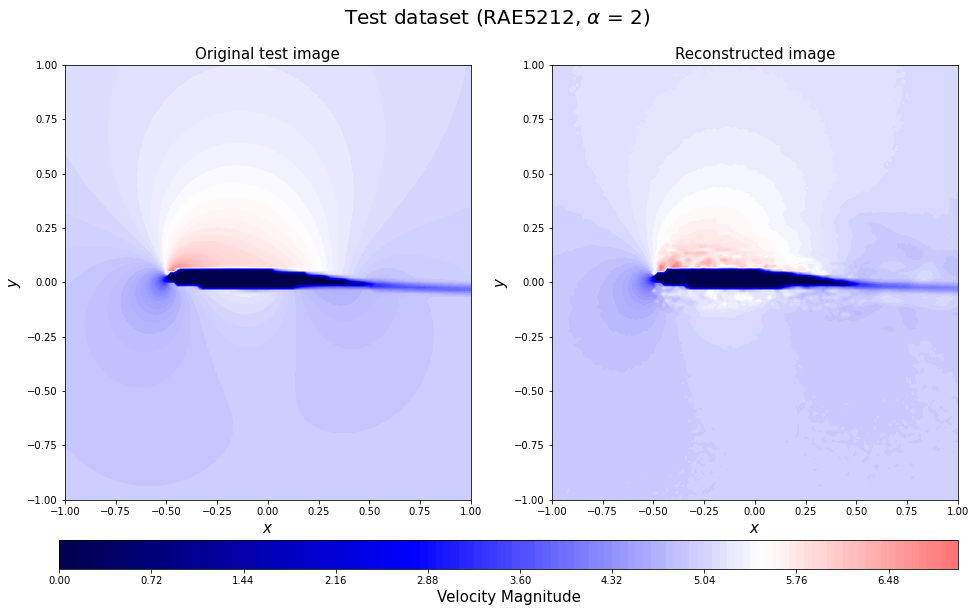

In [83]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

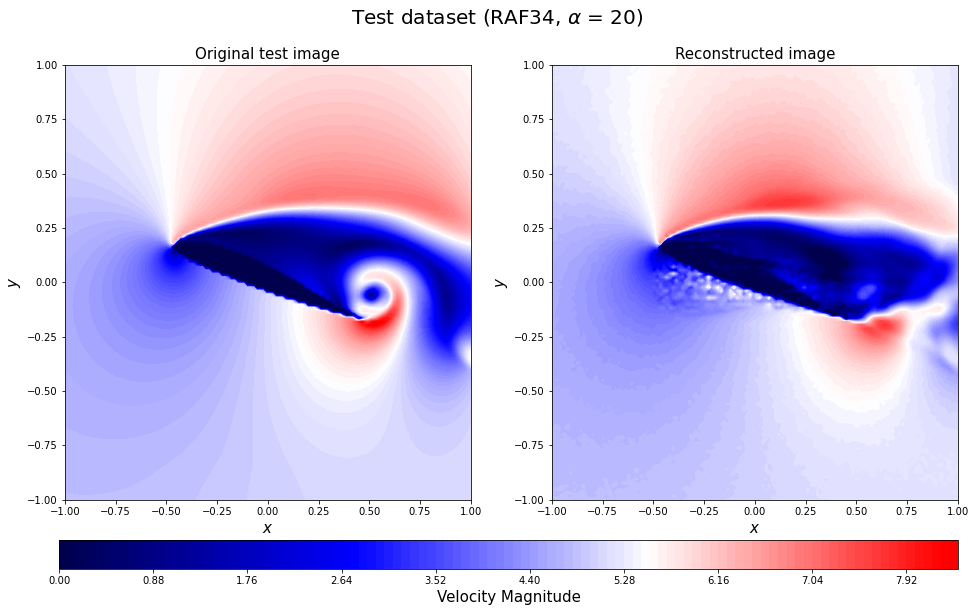

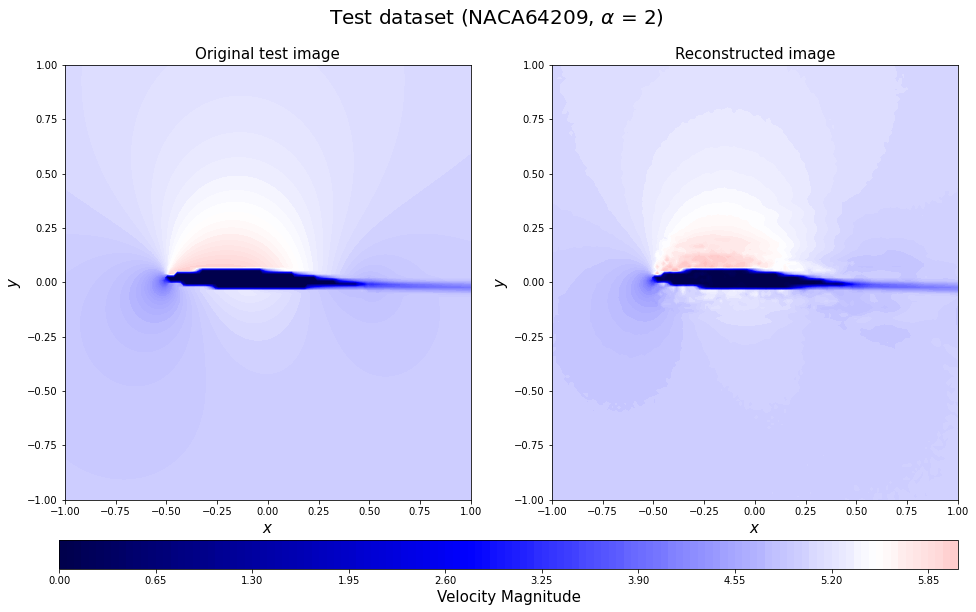

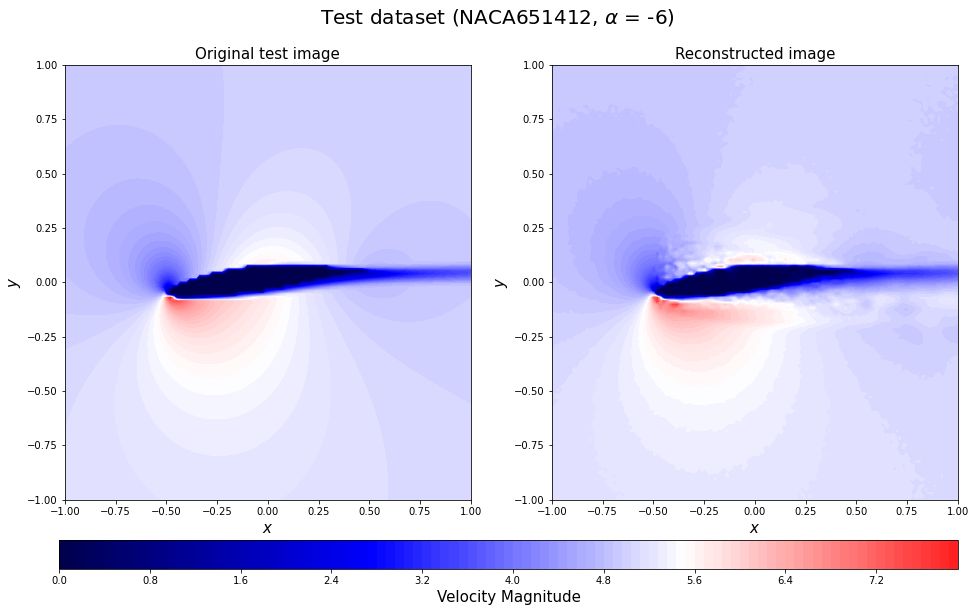

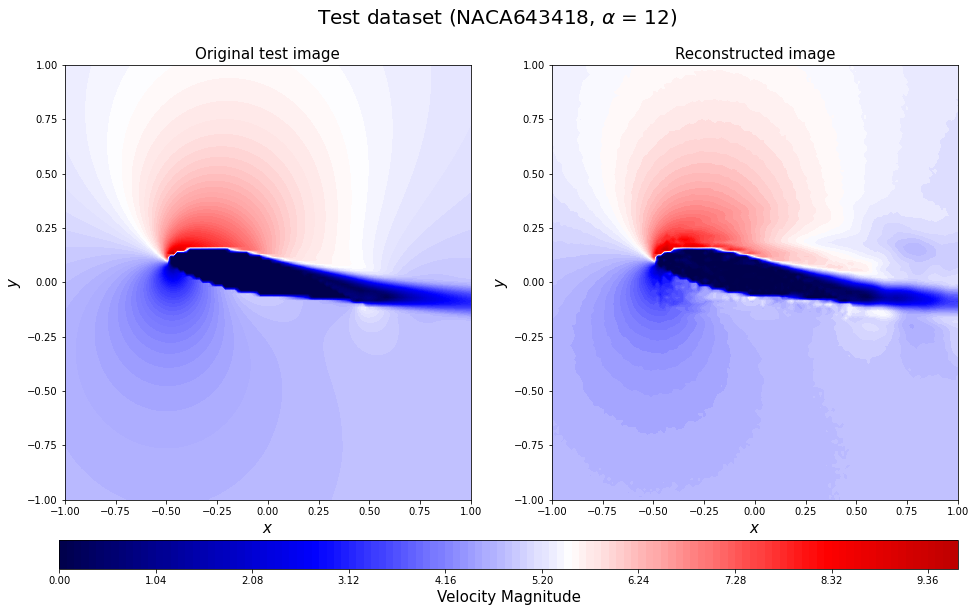

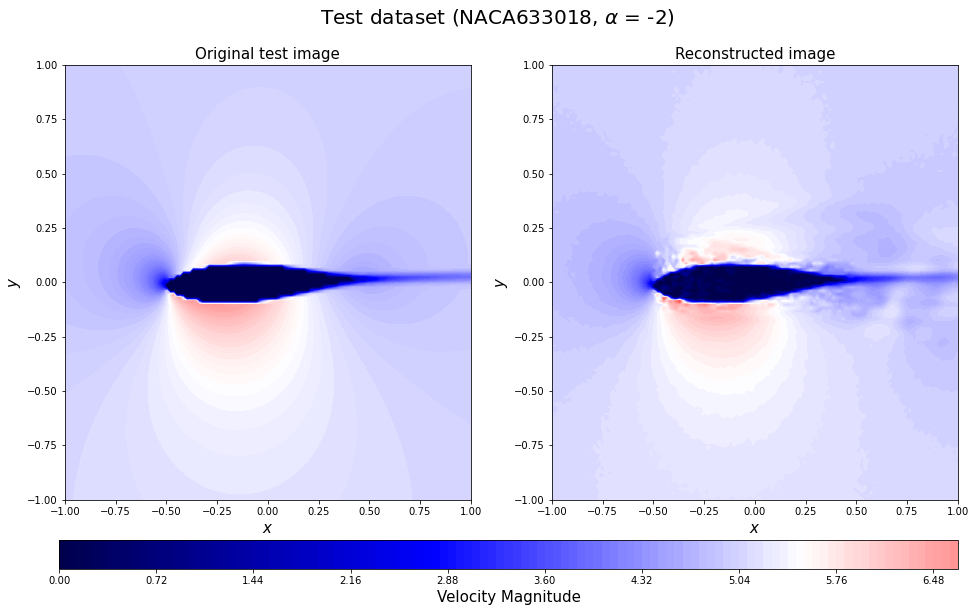

...

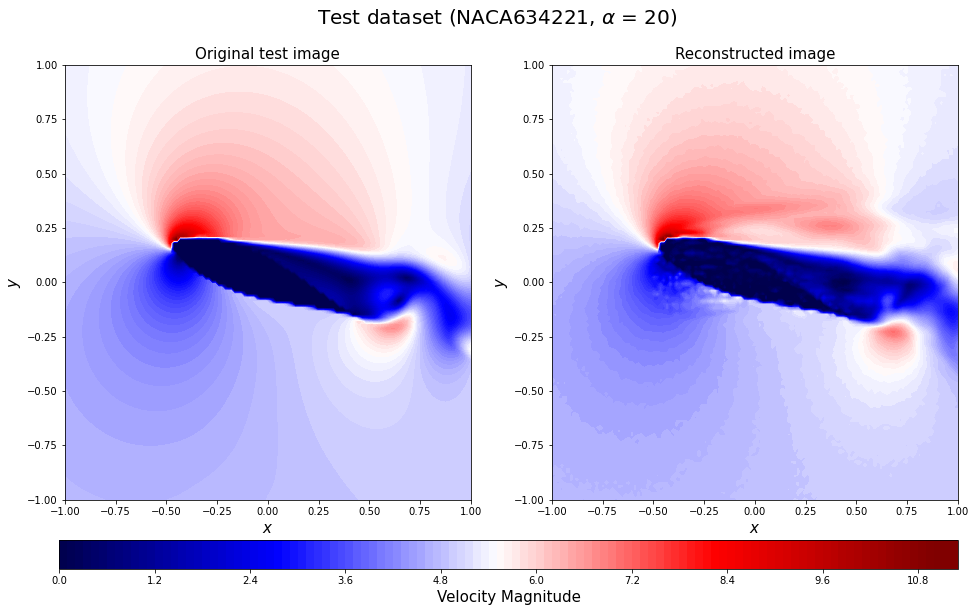

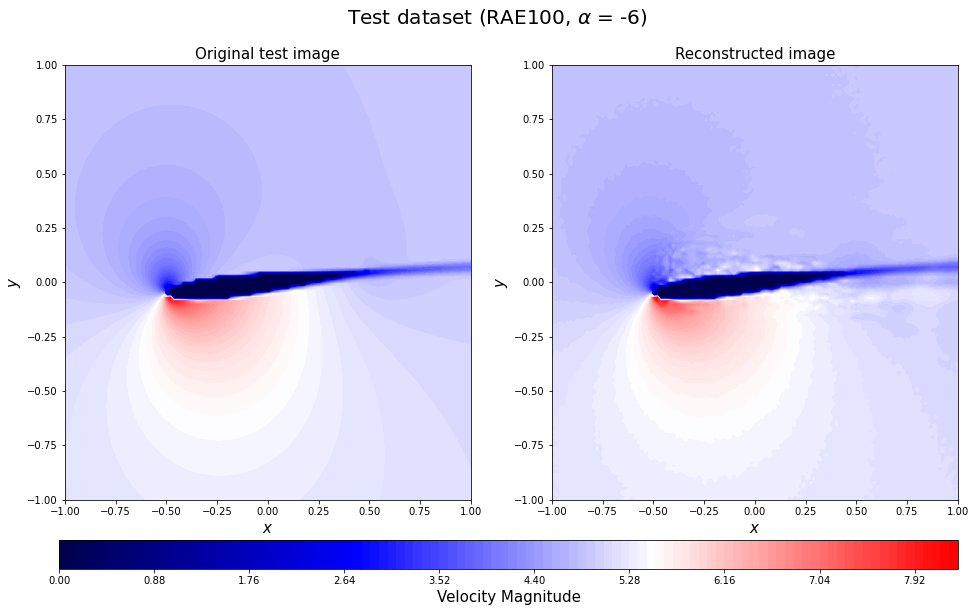

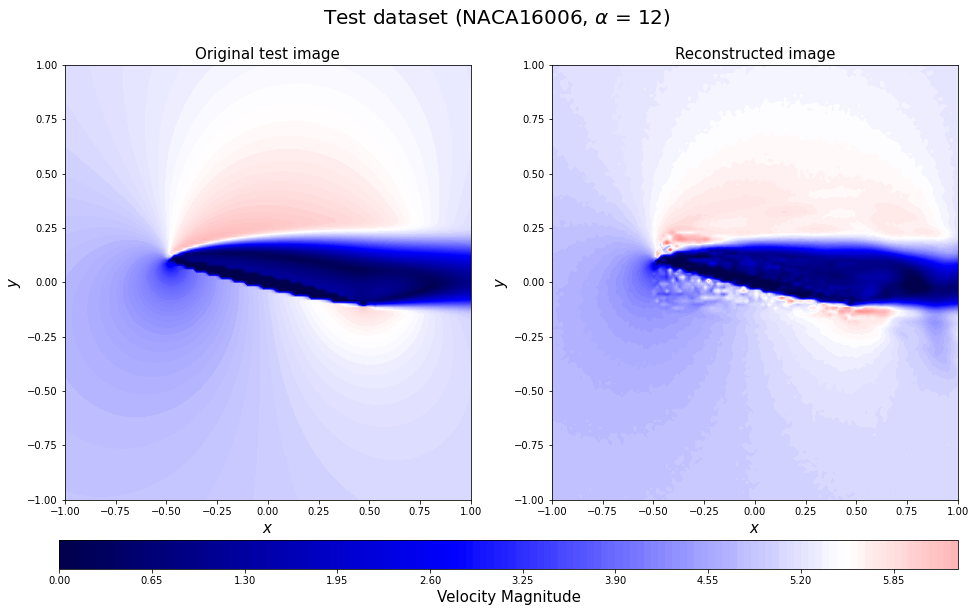

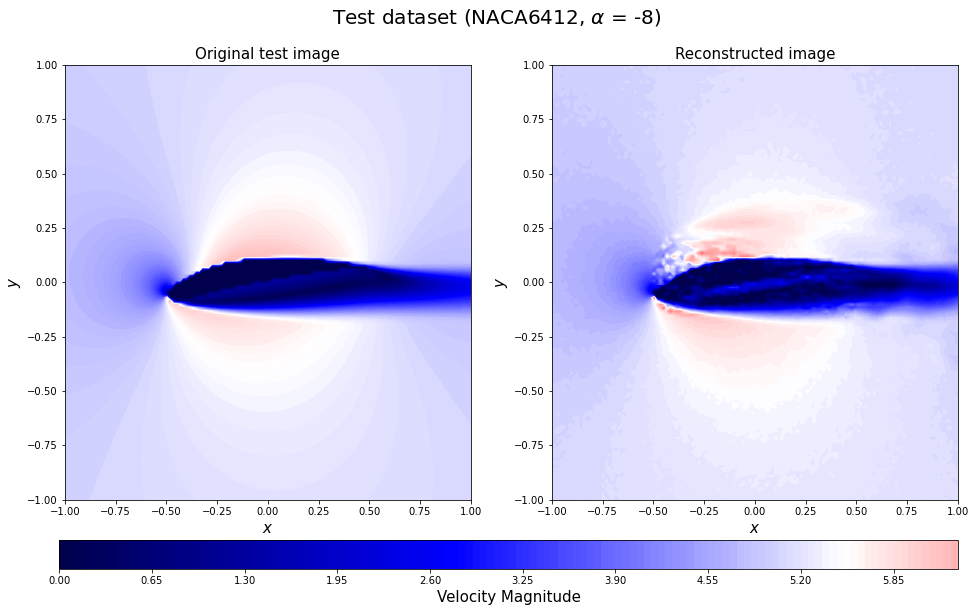

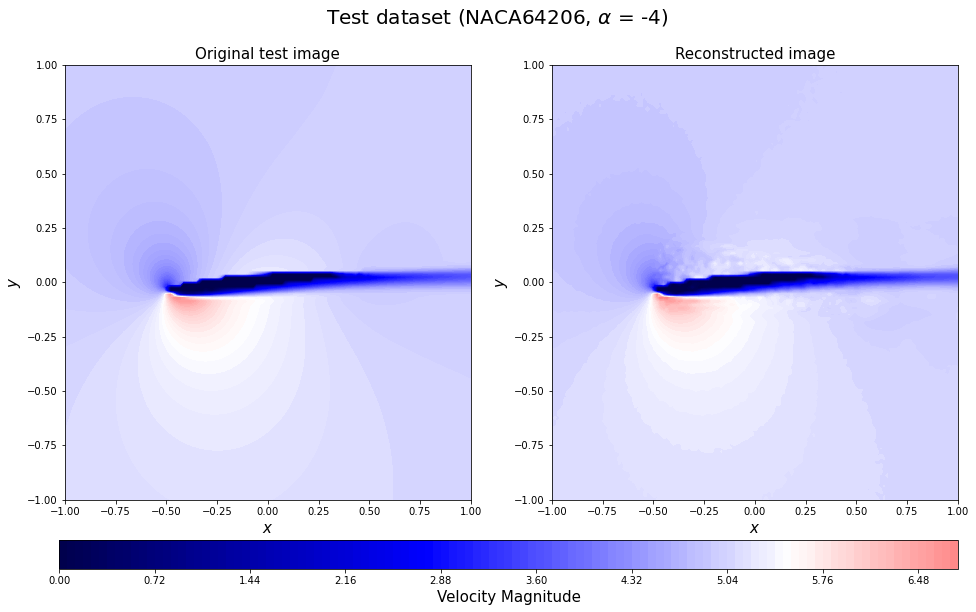

In [84]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

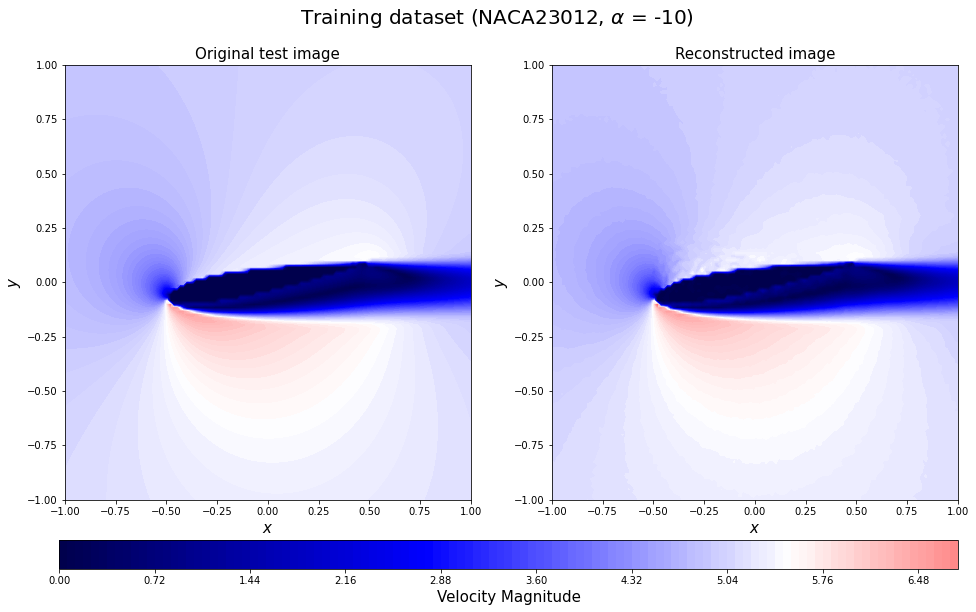

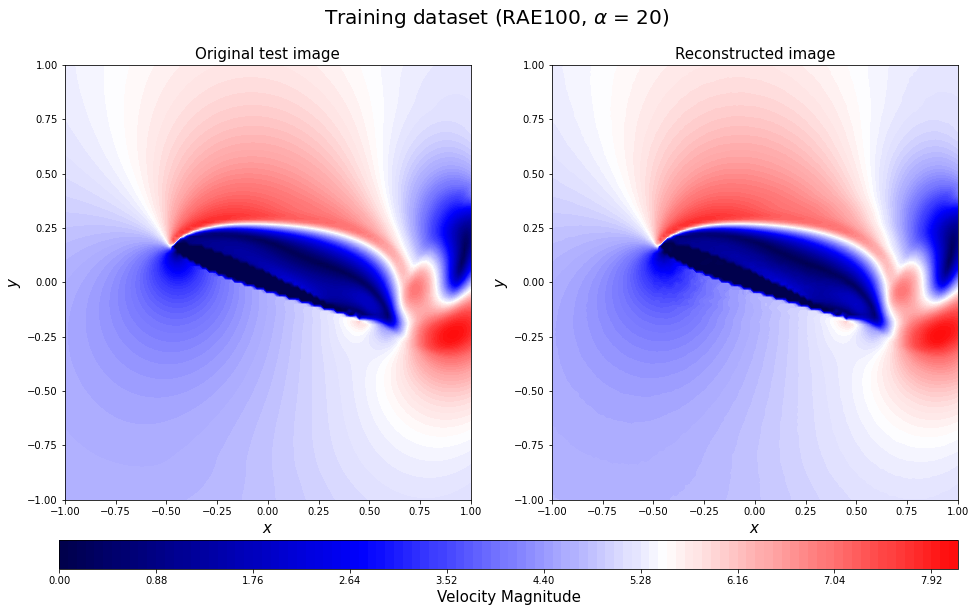

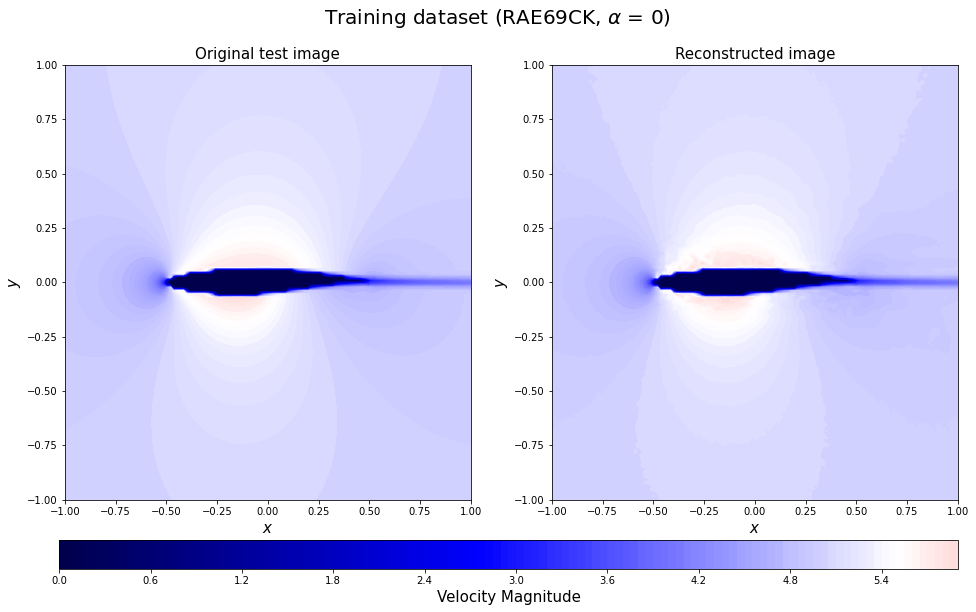

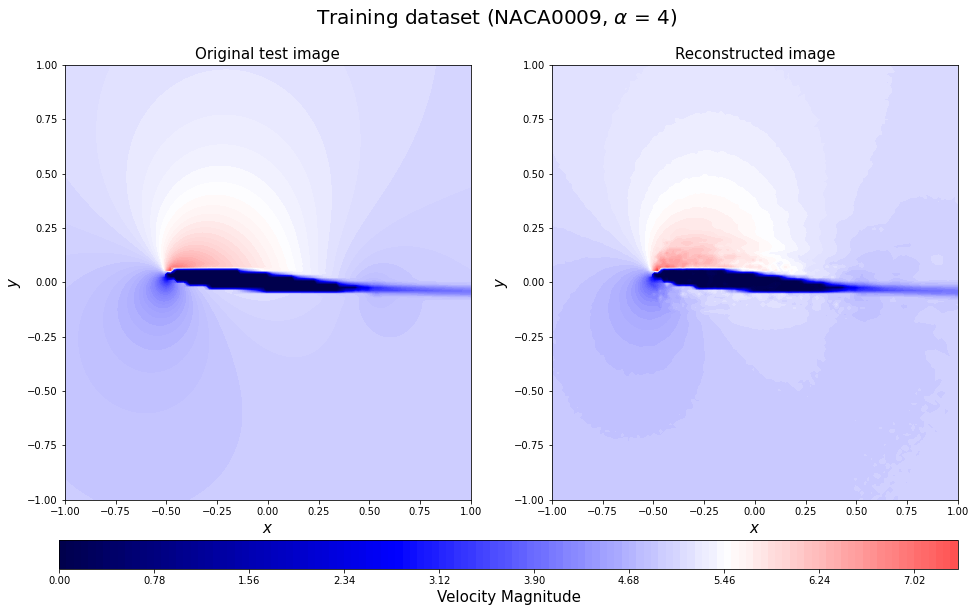

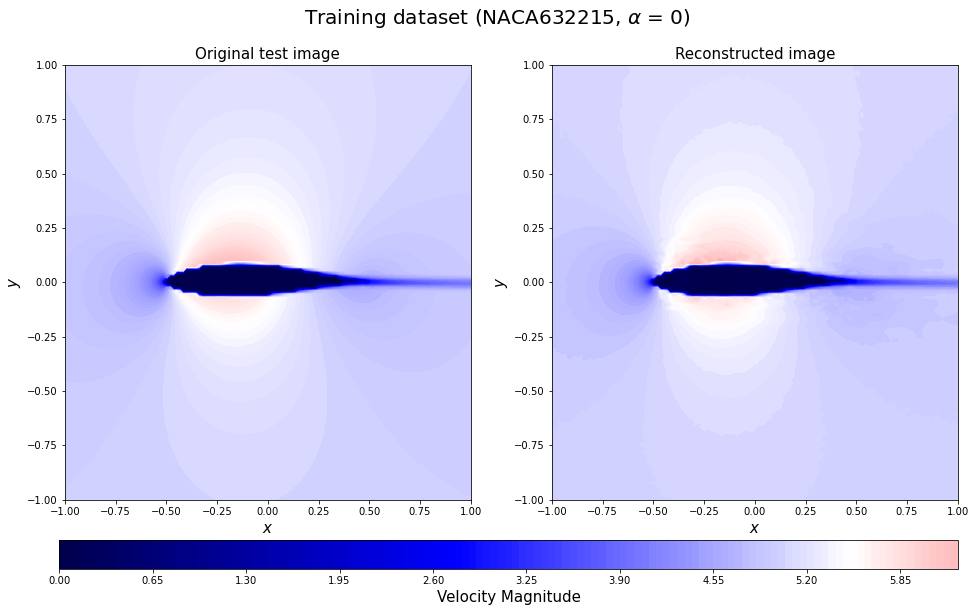

...

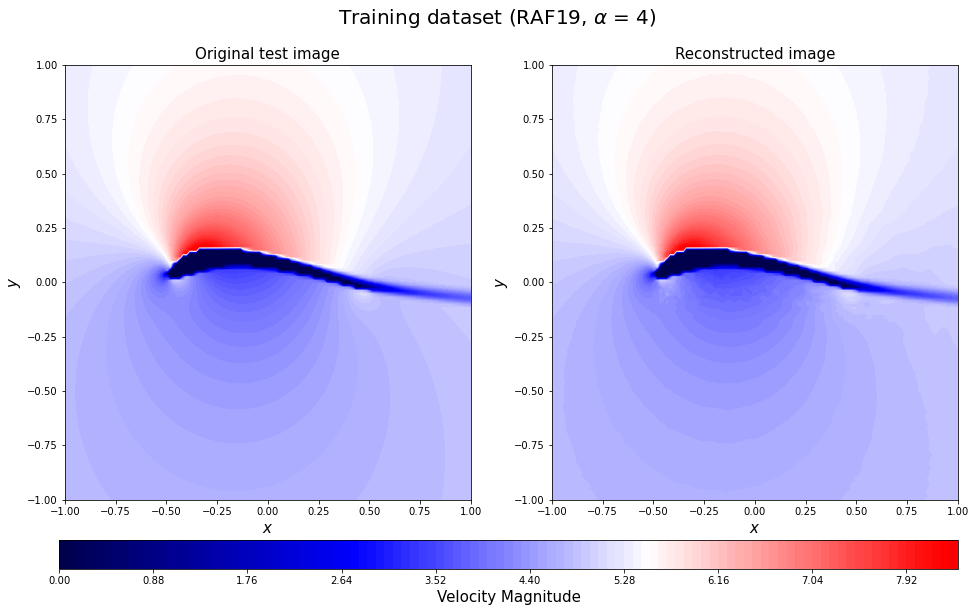

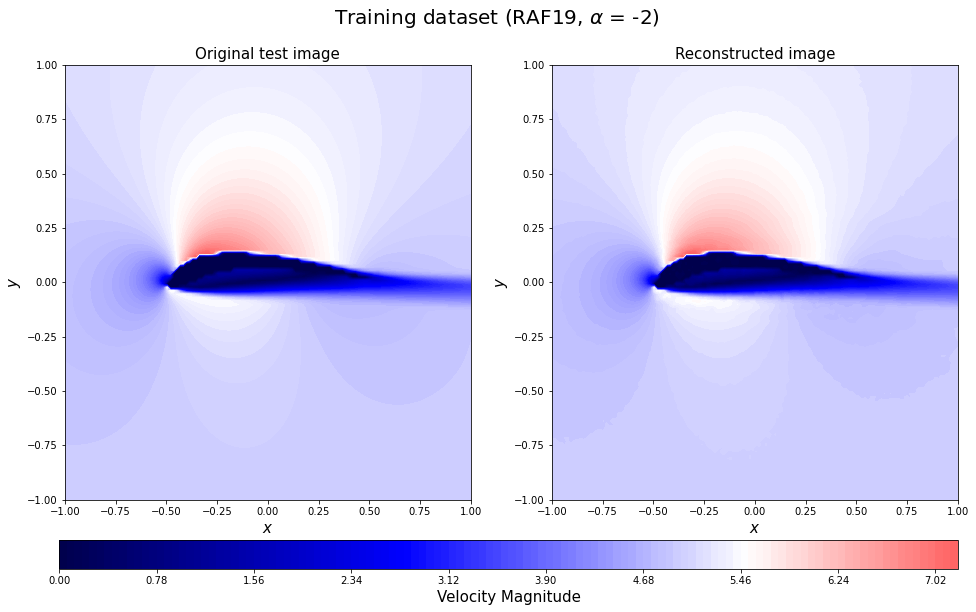

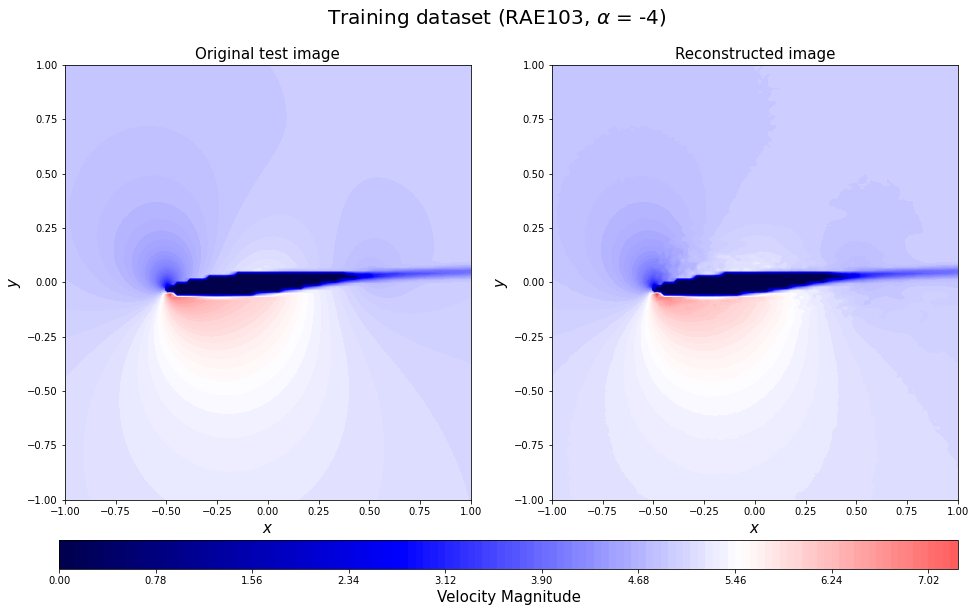

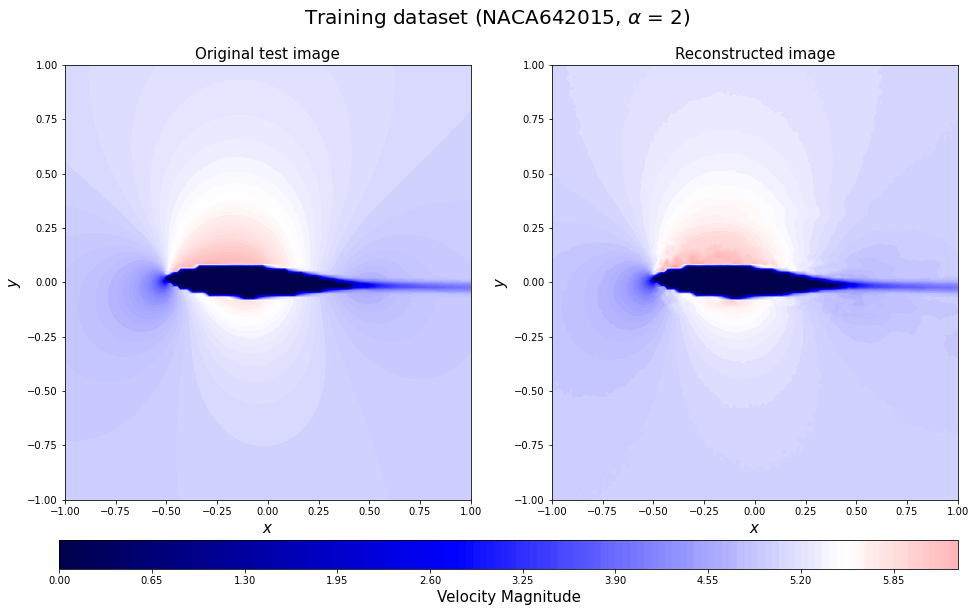

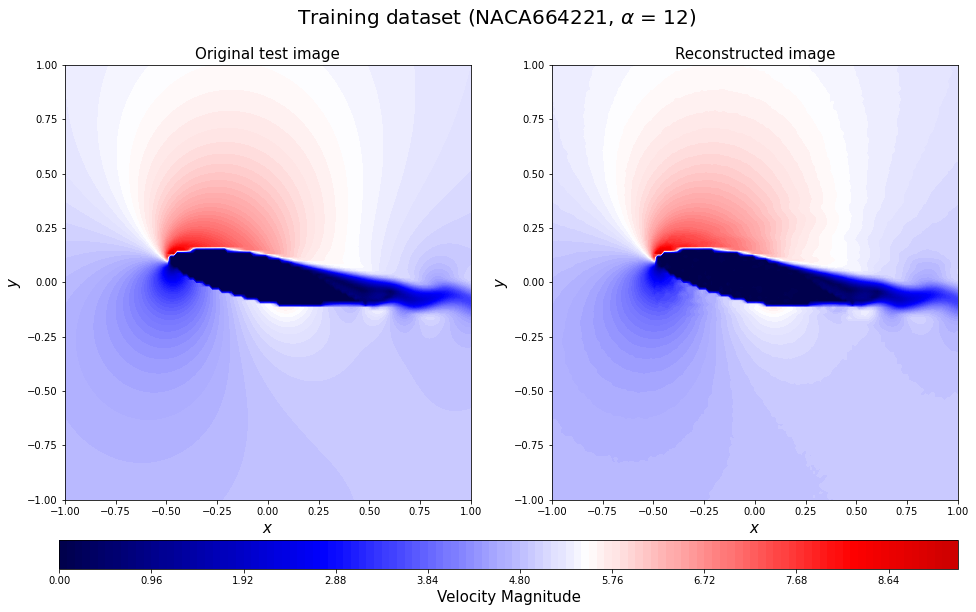

In [85]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

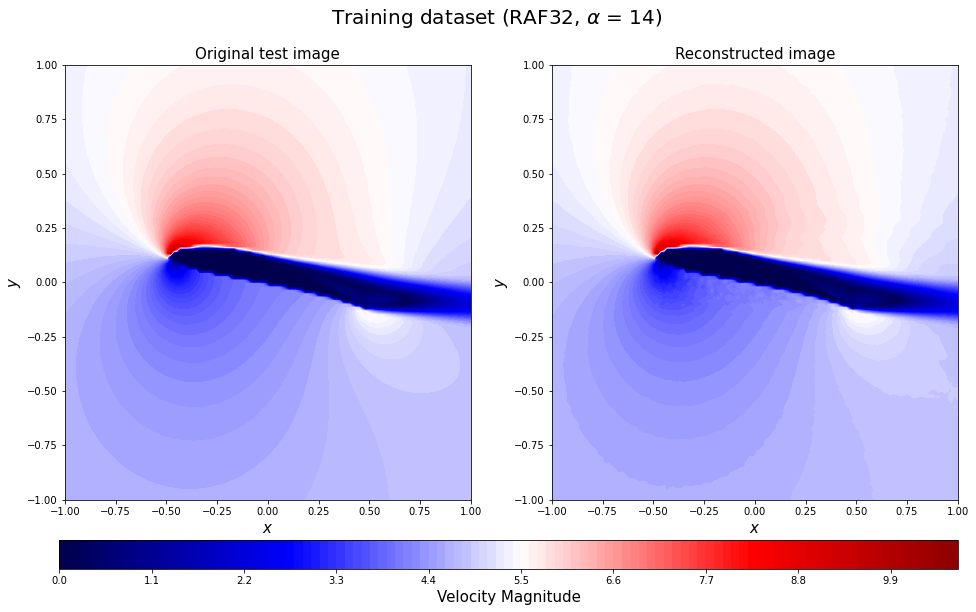

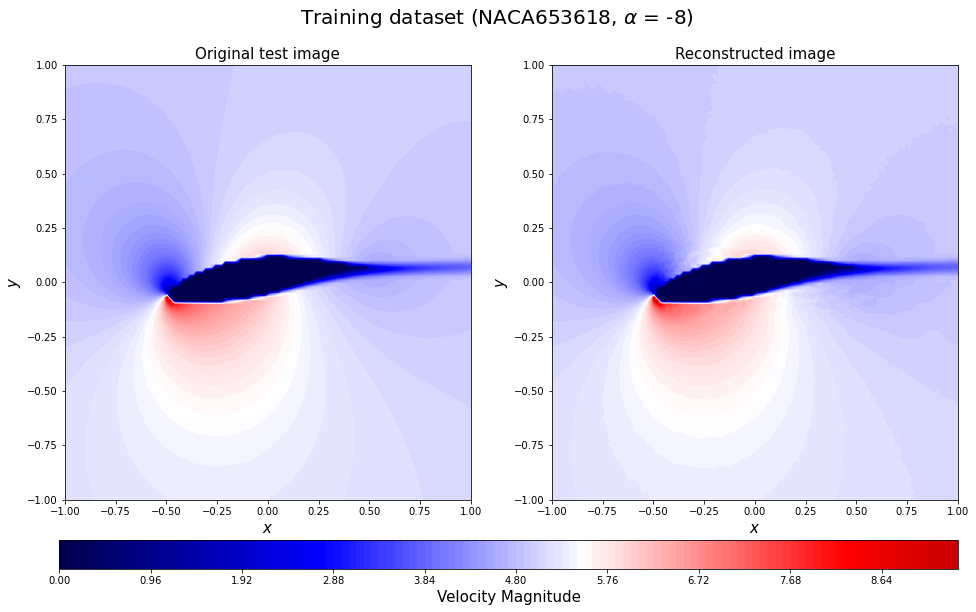

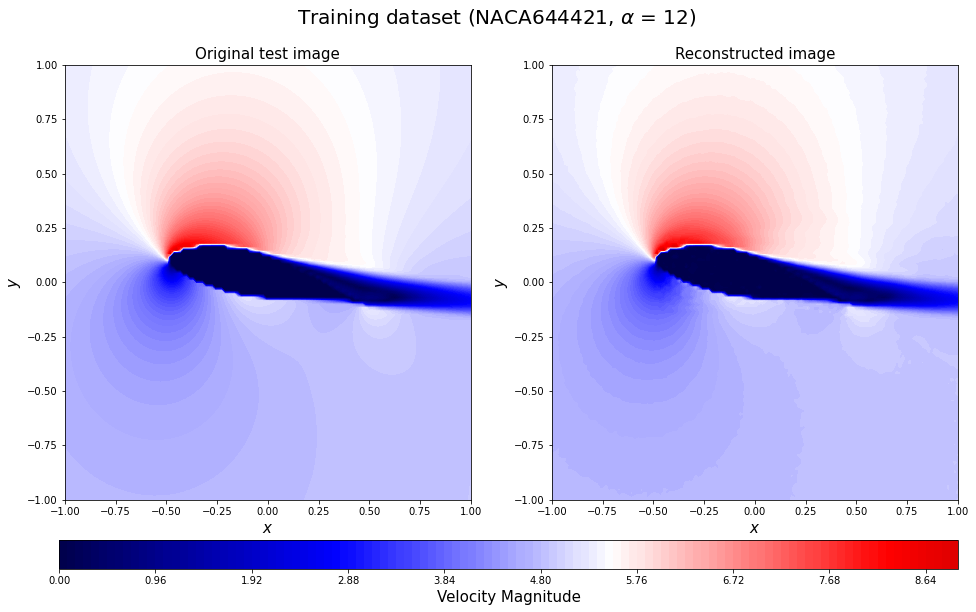

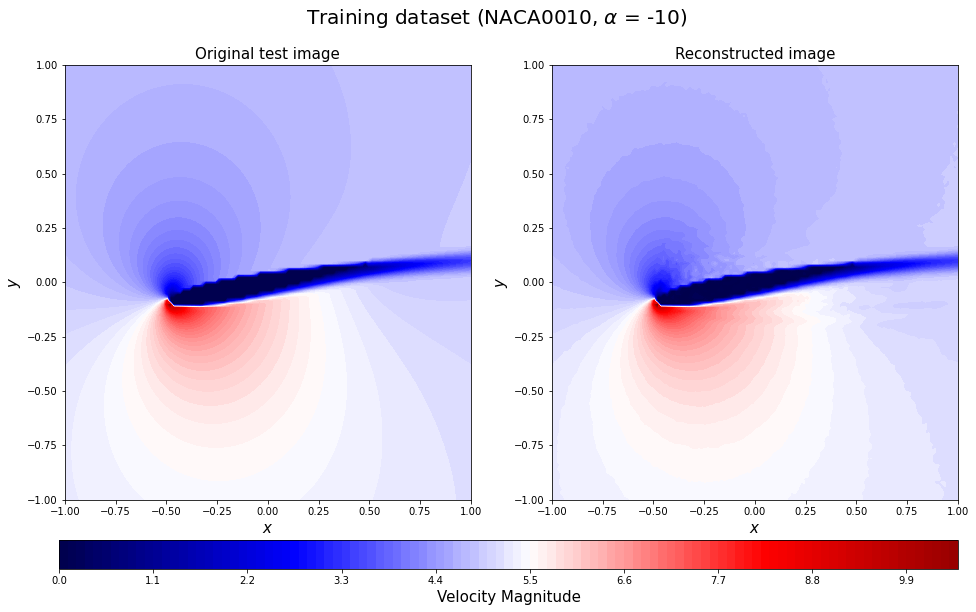

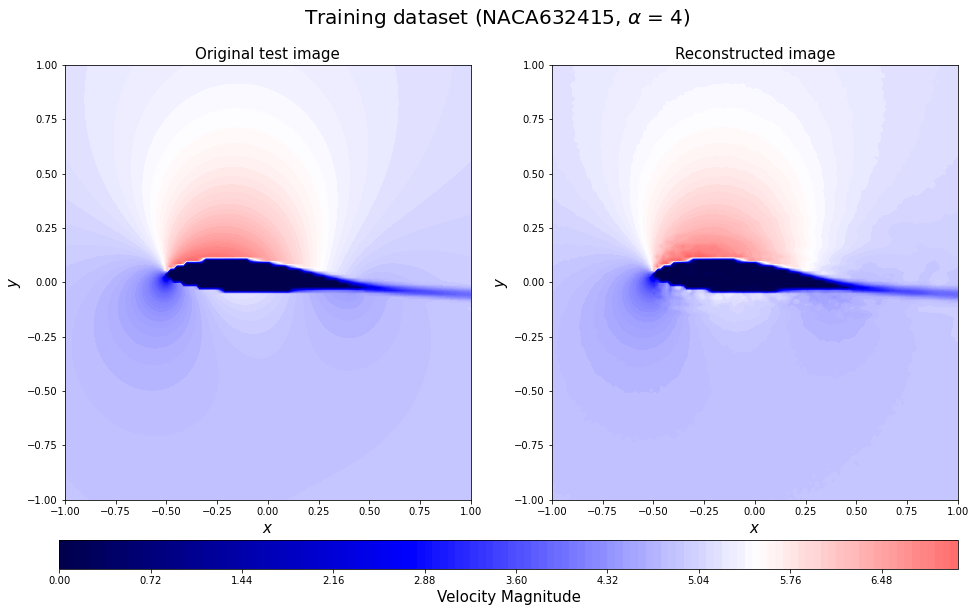

...

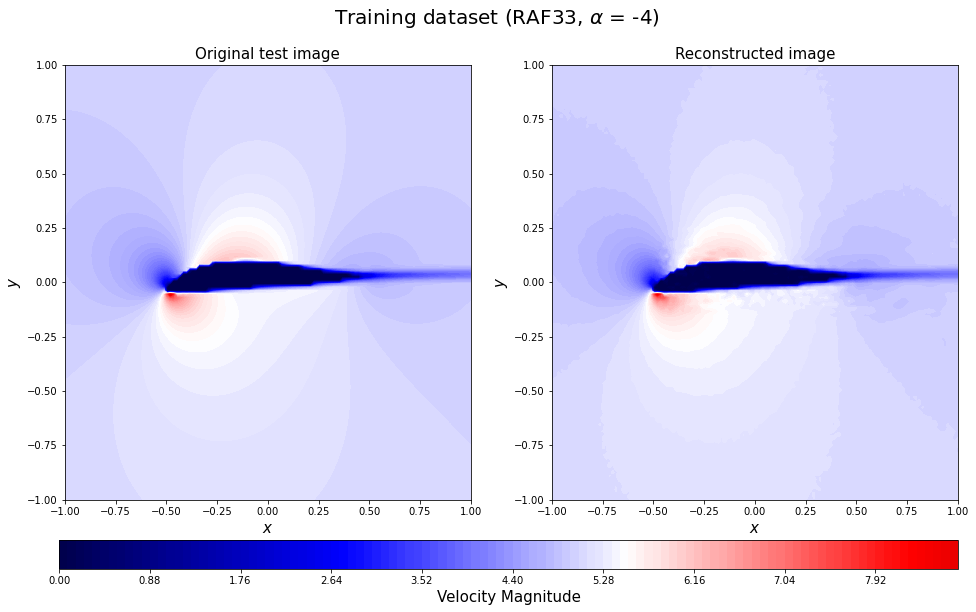

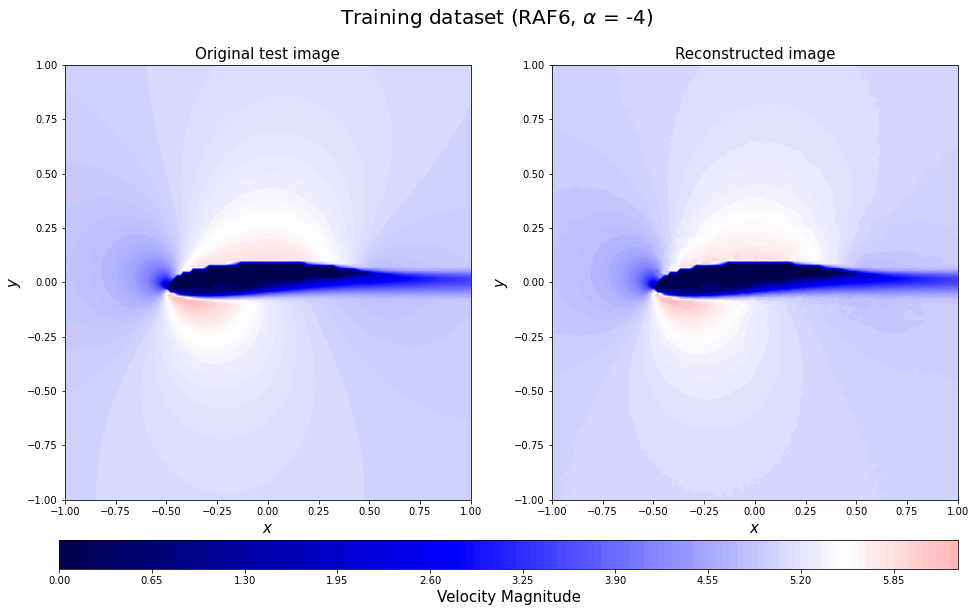

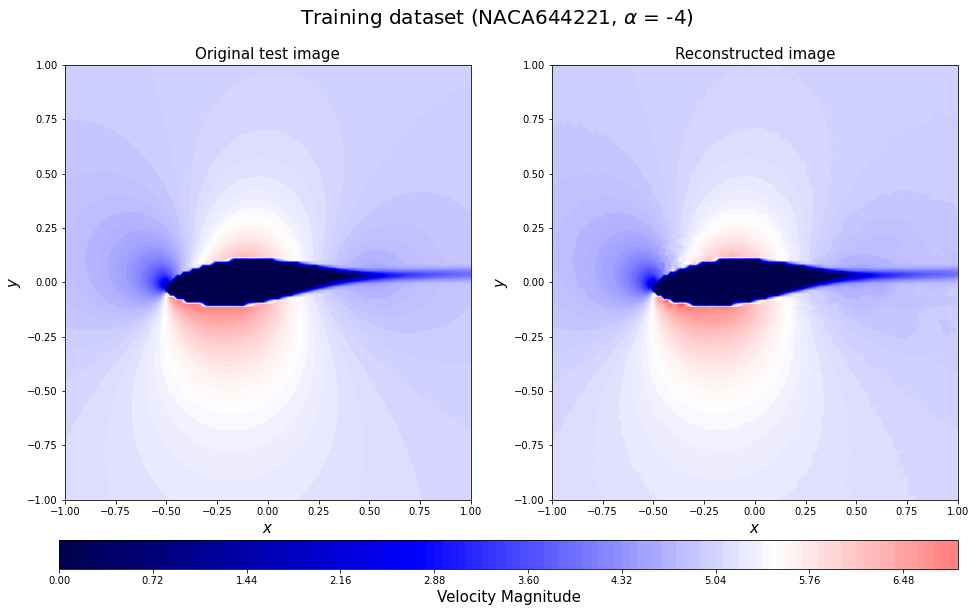

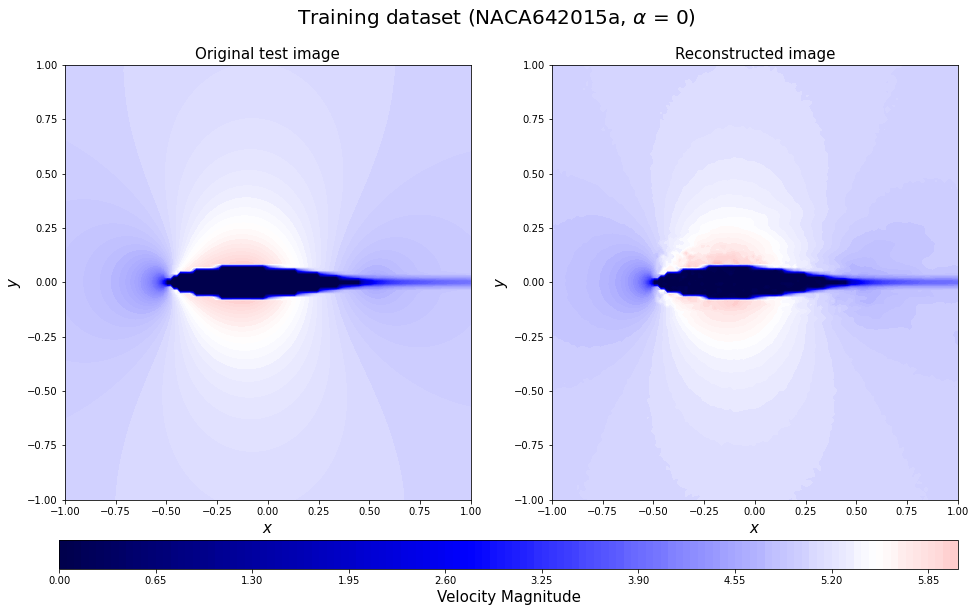

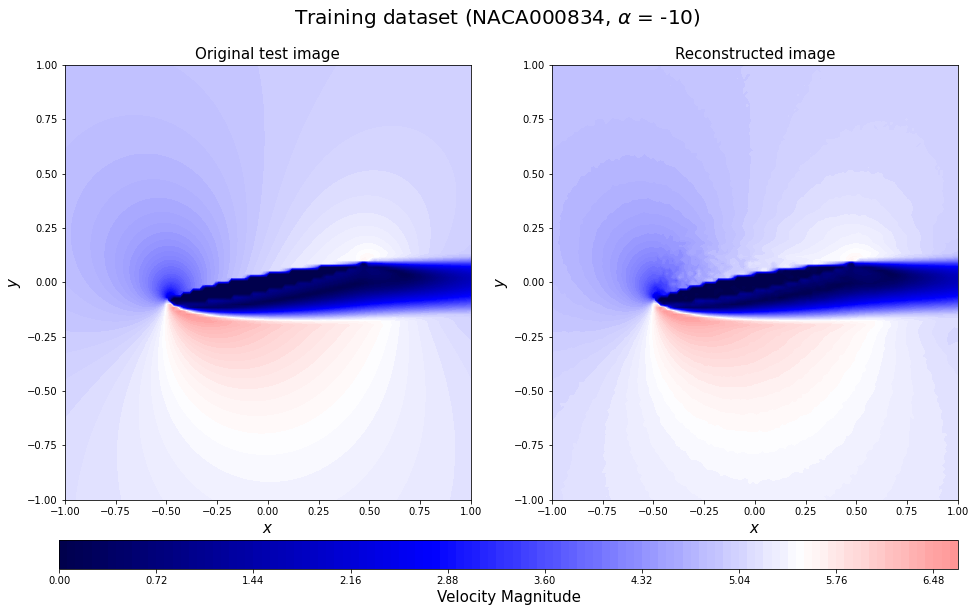

In [86]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

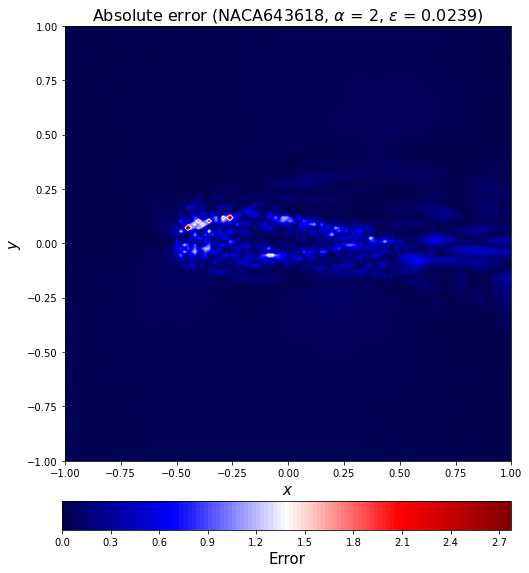

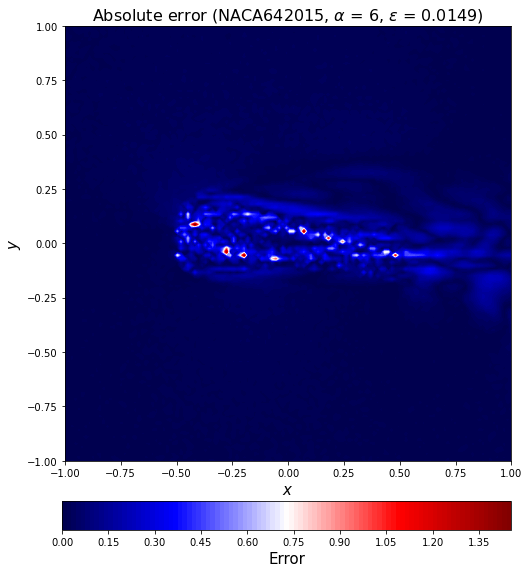

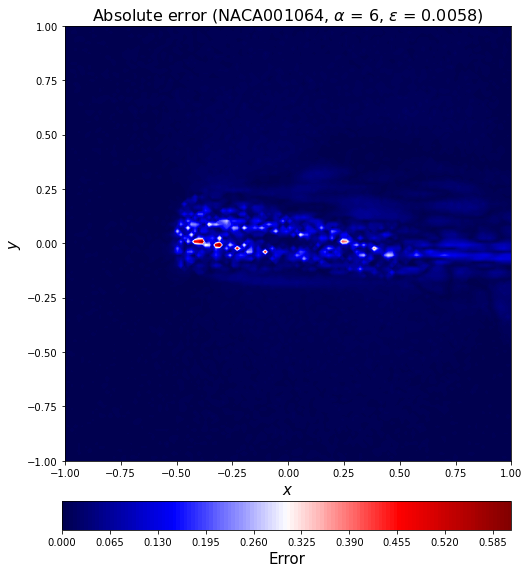

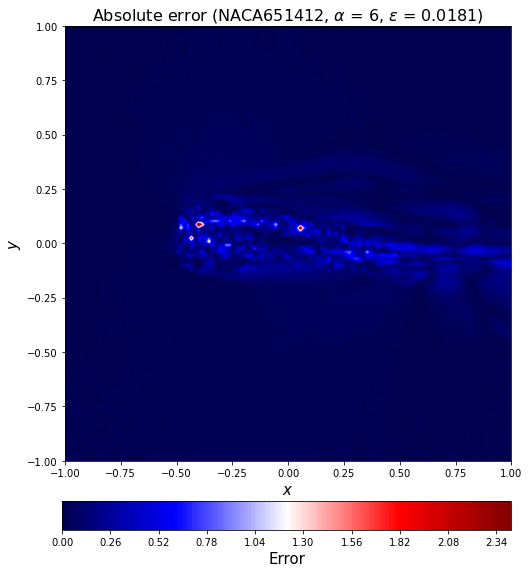

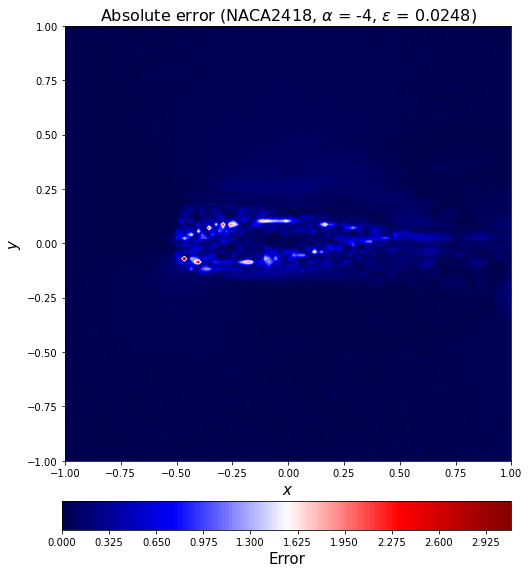

...

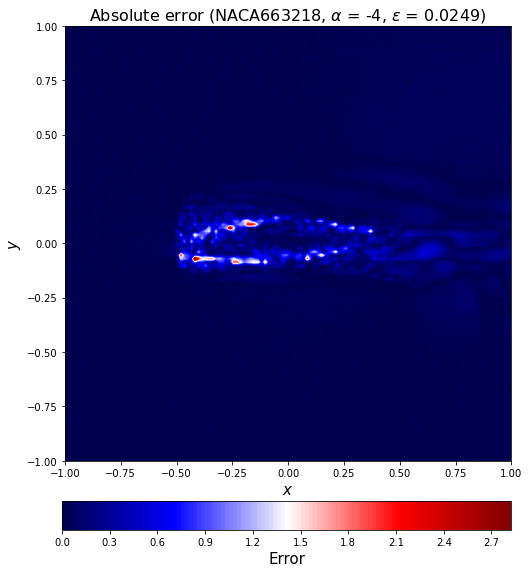

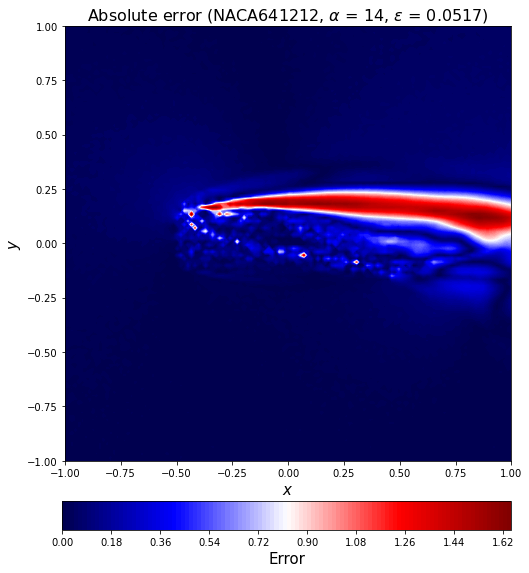

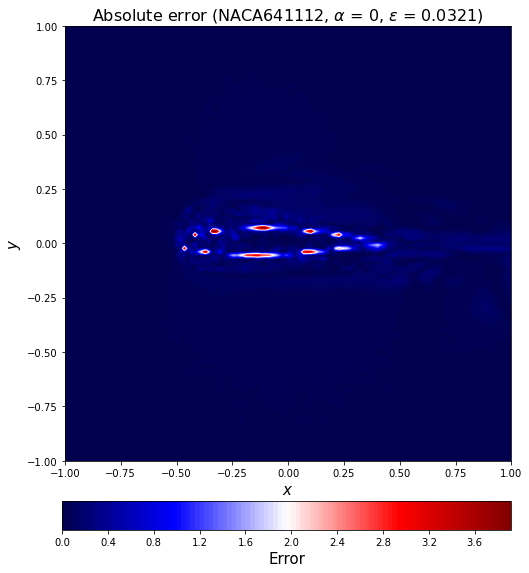

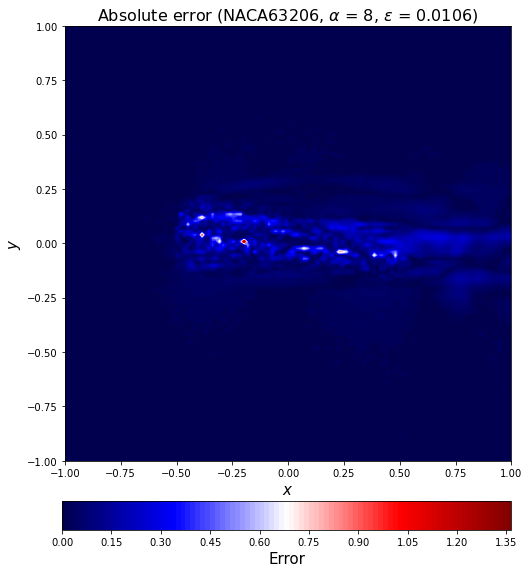

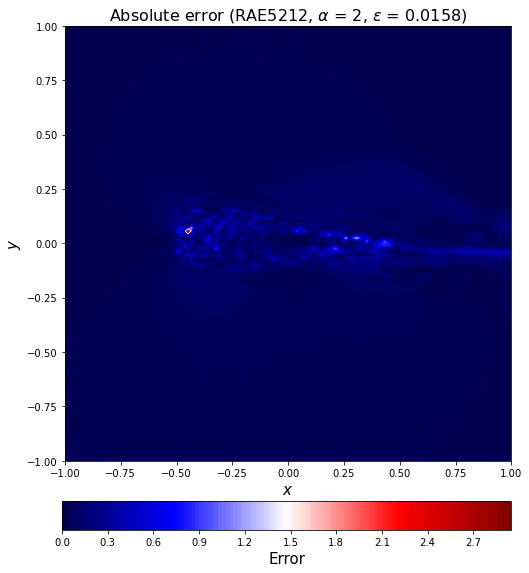

In [87]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

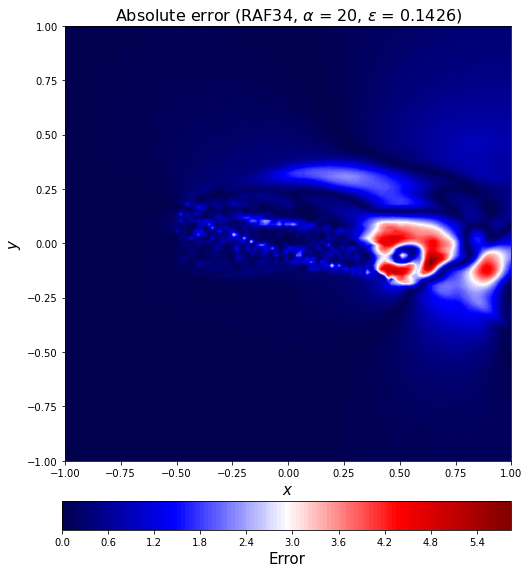

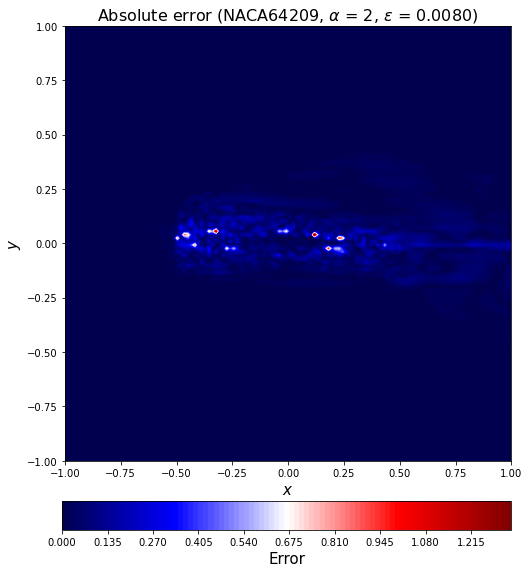

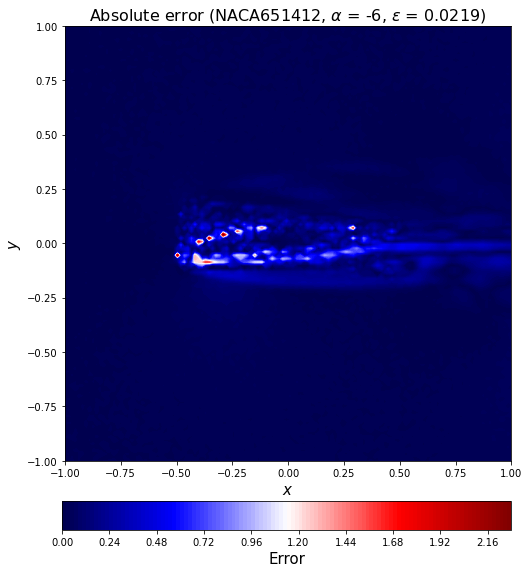

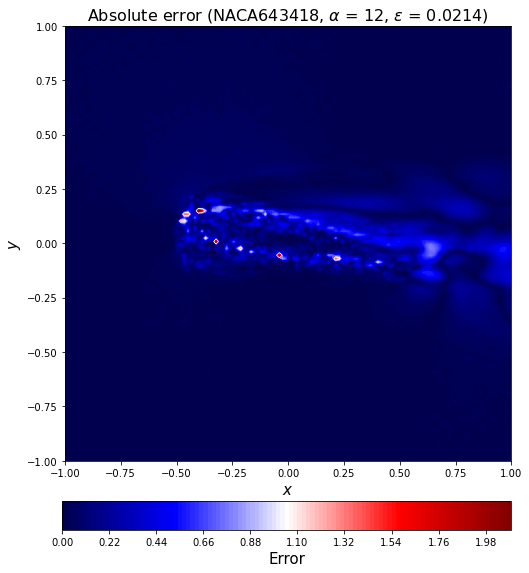

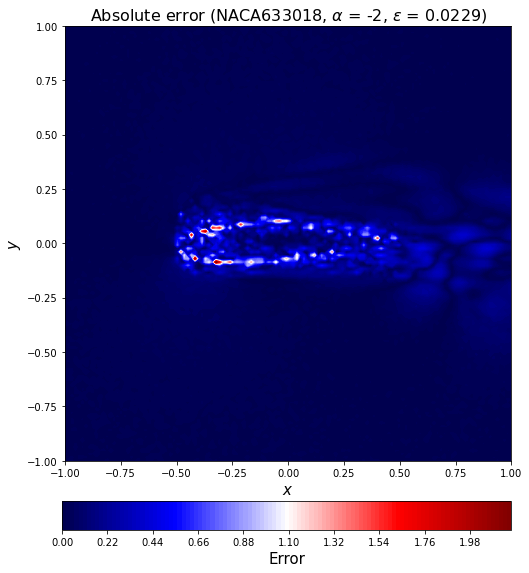

...

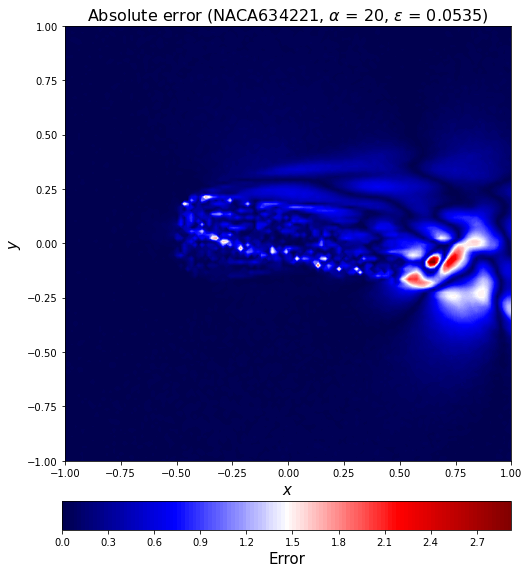

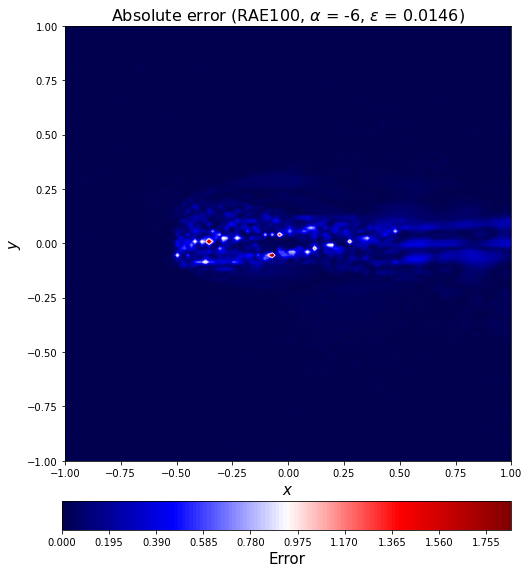

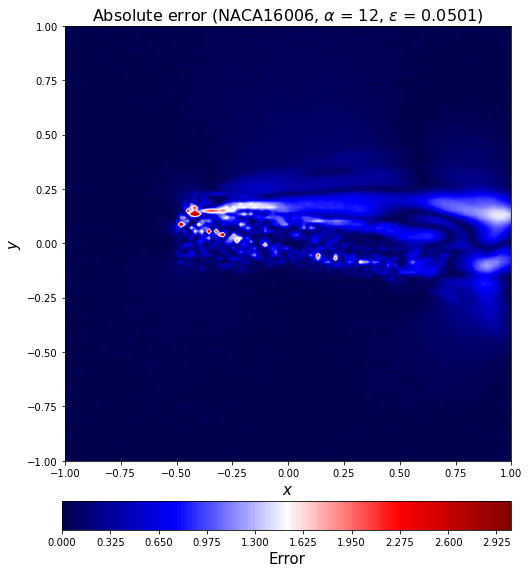

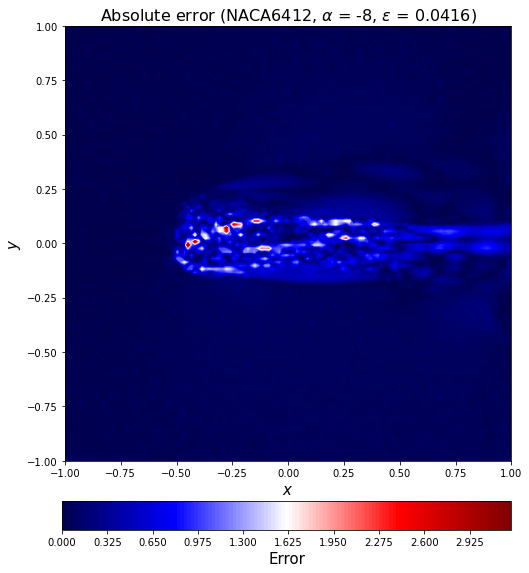

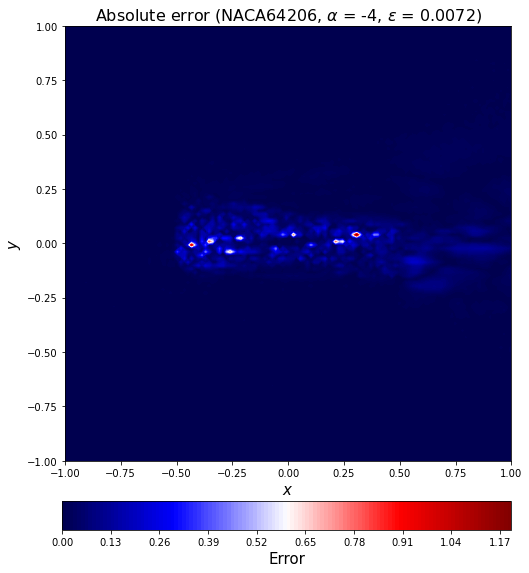

In [88]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

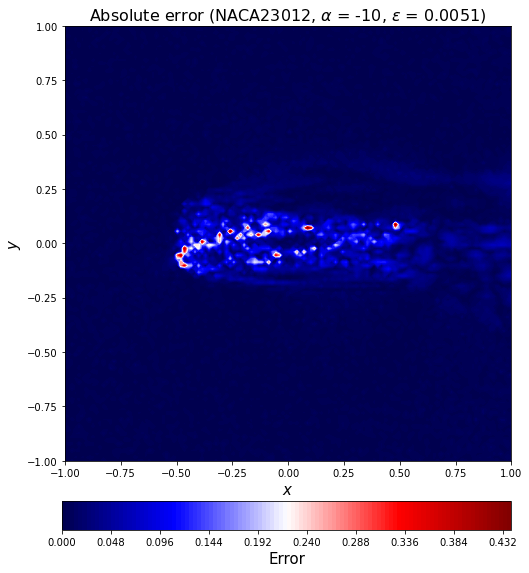

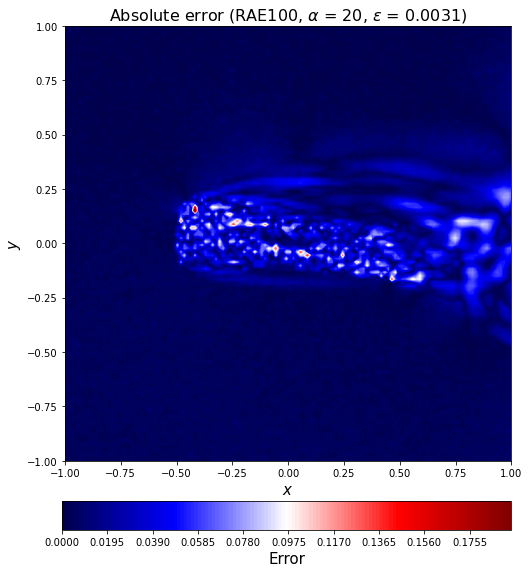

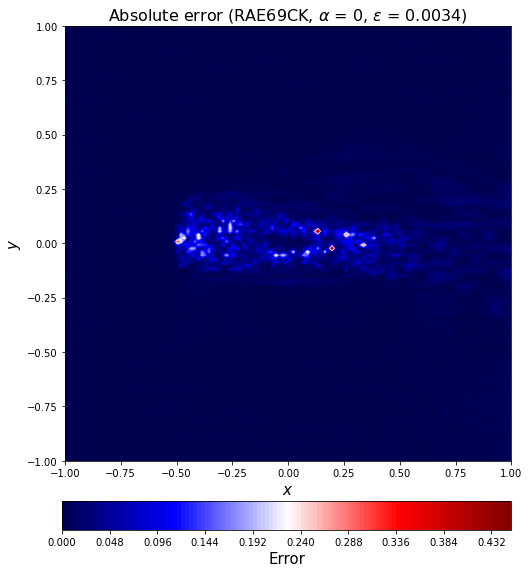

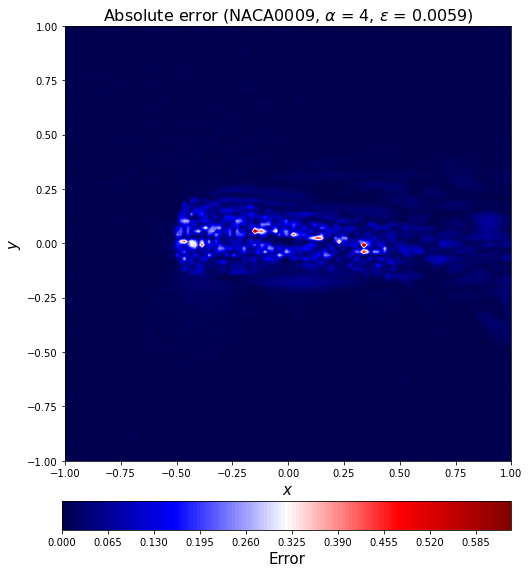

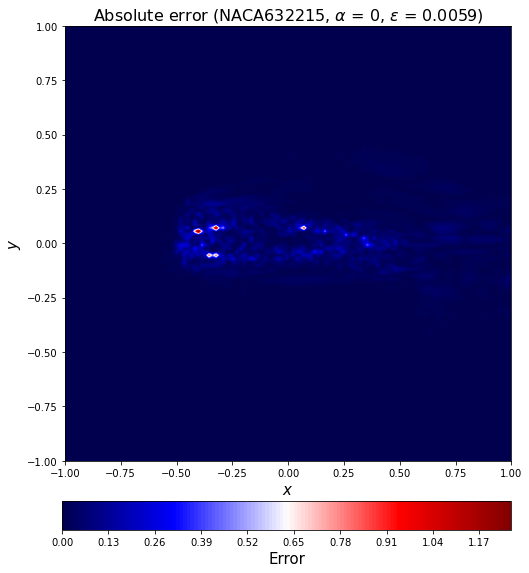

...

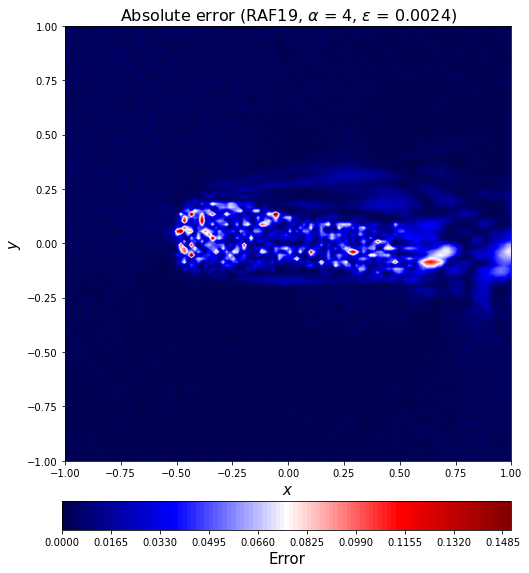

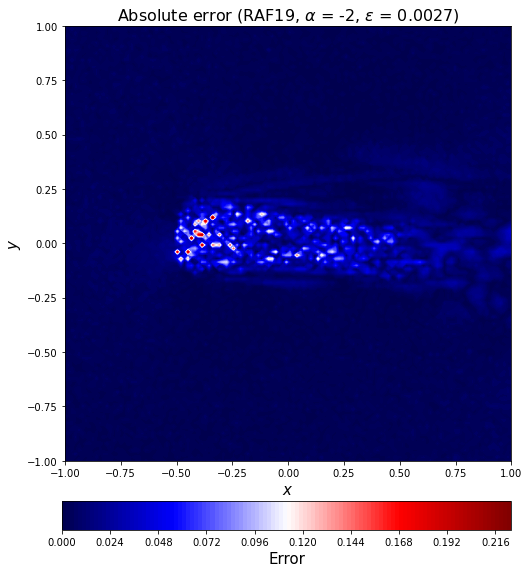

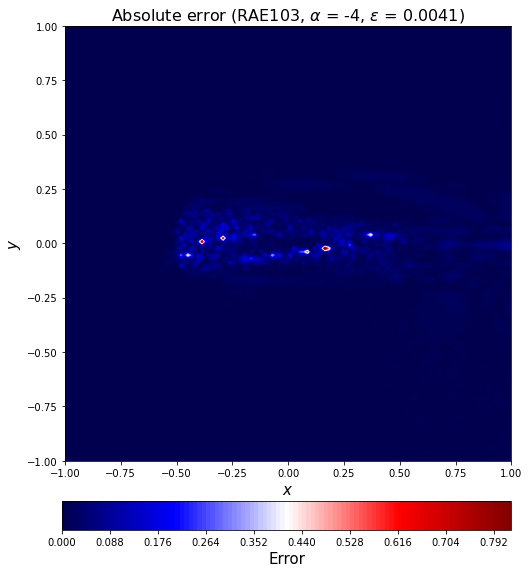

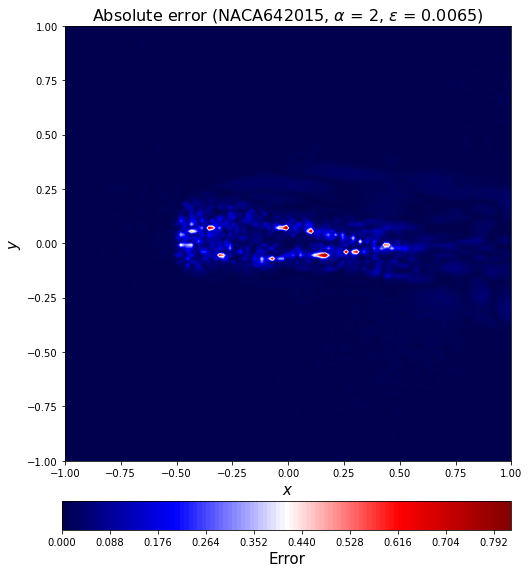

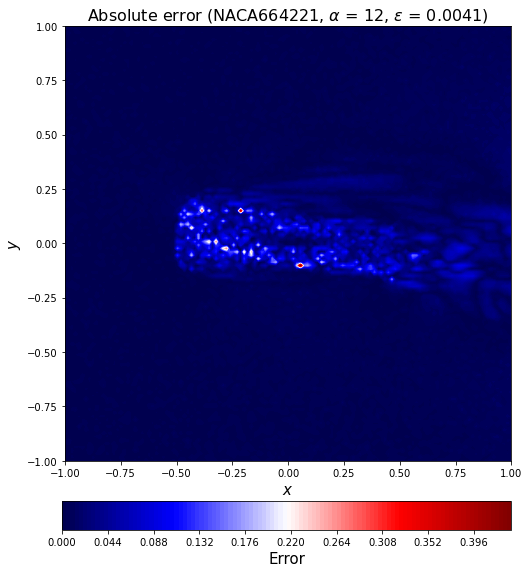

In [89]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

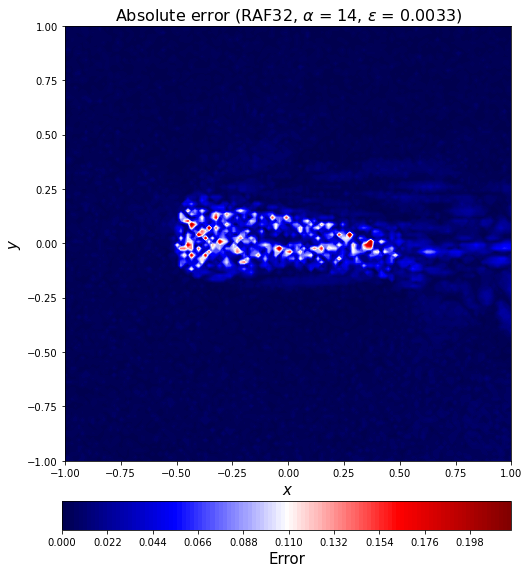

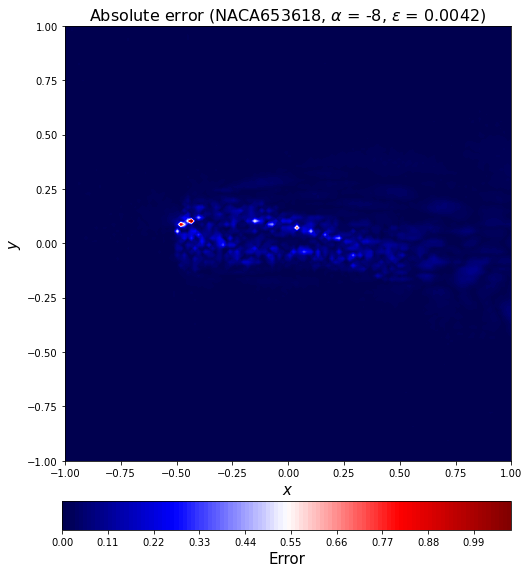

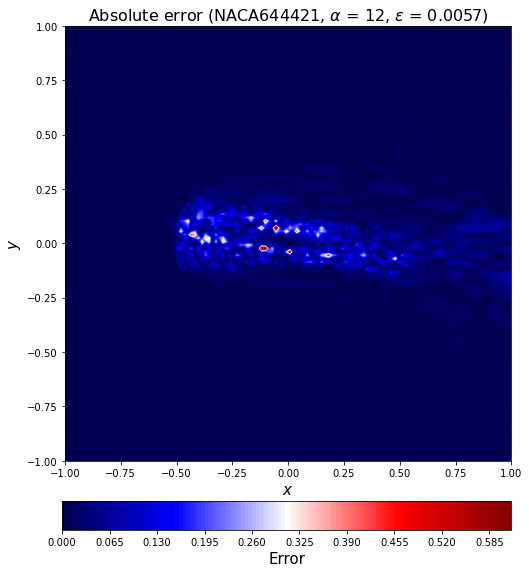

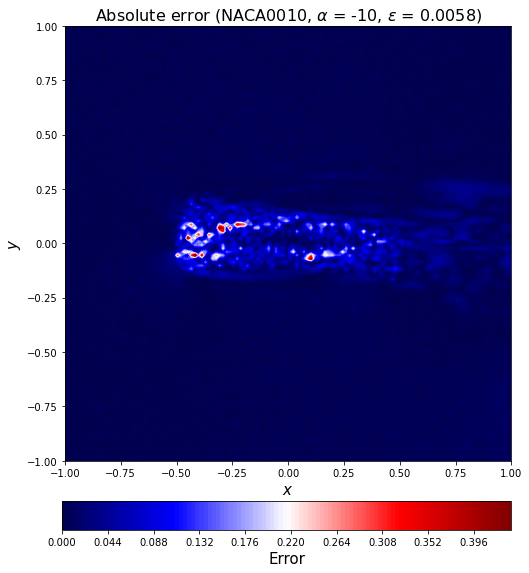

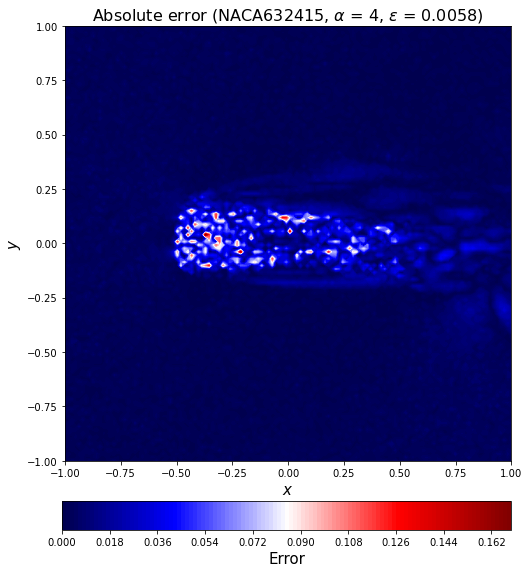

...

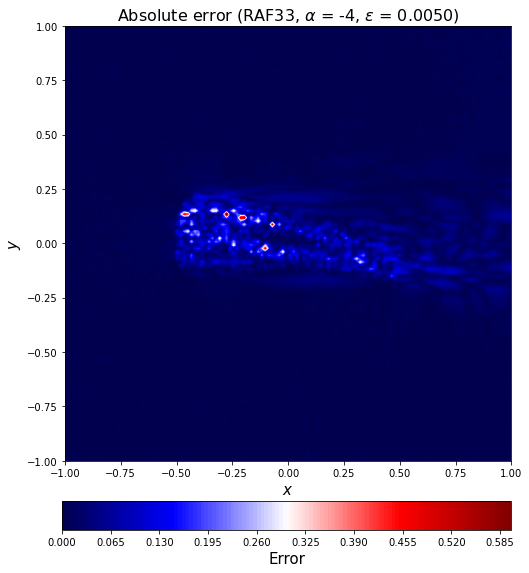

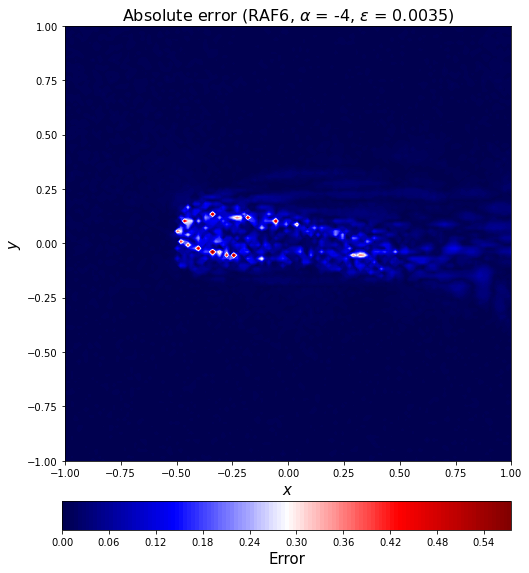

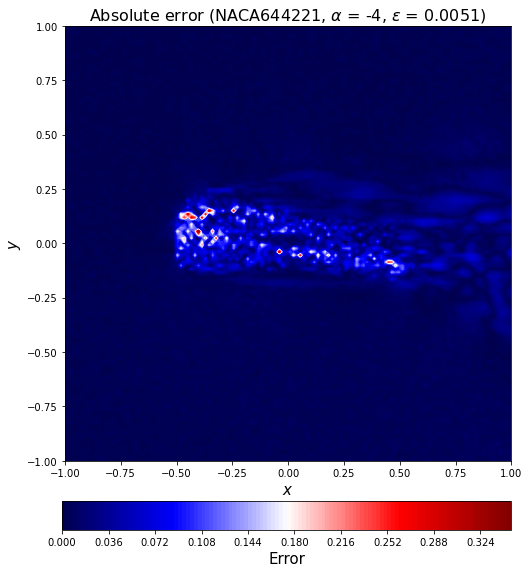

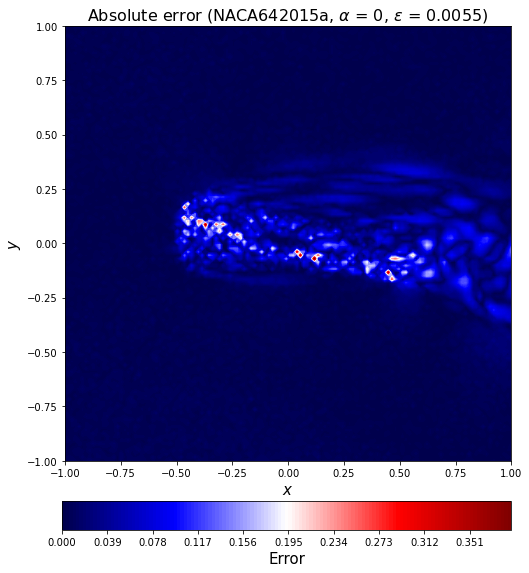

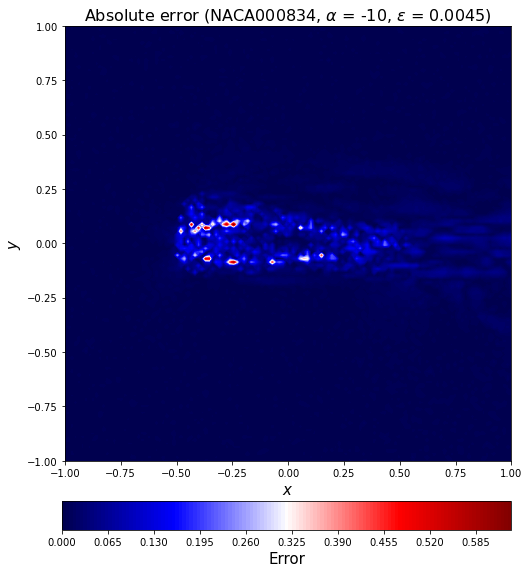

In [90]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[11*20+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()